# LEAD SCORING CASE STUDY

## Step 1: Import of Libraries and Data

### 1.1. Import Libraries, Suppress Warnings and Set Display

In [1]:
#Import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Suppress warnings
import warnings
warnings.filterwarnings("ignore")

#Sklearn libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

#Statmodel libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

In [2]:
#Configure environment settings
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
pd.set_option('display.width',None)

### 1.2. Read the Data

In [3]:
#Read the dataset
df_leads = pd.read_csv("Leads.csv")

In [4]:
#Print the column names of the dataset
print(df_leads.columns)

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')


In [5]:
df_leads.head

<bound method NDFrame.head of                                Prospect ID  Lead Number  \
0     7927b2df-8bba-4d29-b9a2-b6e0beafe620       660737   
1     2a272436-5132-4136-86fa-dcc88c88f482       660728   
2     8cc8c611-a219-4f35-ad23-fdfd2656bd8a       660727   
3     0cc2df48-7cf4-4e39-9de9-19797f9b38cc       660719   
4     3256f628-e534-4826-9d63-4a8b88782852       660681   
5     2058ef08-2858-443e-a01f-a9237db2f5ce       660680   
6     9fae7df4-169d-489b-afe4-0f3d752542ed       660673   
7     20ef72a2-fb3b-45e0-924e-551c5fa59095       660664   
8     cfa0128c-a0da-4656-9d47-0aa4e67bf690       660624   
9     af465dfc-7204-4130-9e05-33231863c4b5       660616   
10    2a369e35-ca95-4ca9-9e4f-9d27175aa320       660608   
11    9bc8ce93-6144-49e0-9f9d-080fc980f83c       660570   
12    8bf76a52-2478-476b-8618-1688e07874ad       660562   
13    88867067-3750-4753-8d33-1c7d1db53b5e       660558   
14    a8531c22-fcf1-48f8-a711-fb5abf98ad87       660553   
15    25f4ac14-ff4b-4cd2-9

In [6]:
df_leads.shape

(9240, 37)

NOTE: 

The original dataframe has 9240 rows and 37 columns.

## Step 2: Data Understanding and Inspection

In [7]:
df_leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [8]:
#Check the number of unique values in each column
df_leads.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     19
How did you hear about X Education                 10
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

In [9]:
#Check data types of columns and nulls
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

NOTE: 

There are "null values" in the dataframe.

In [10]:
#Check for missing values in each column
df_leads.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

NOTE: 

There are few columns with quite a high number of missing/ null values in the dataframe. We will have to decide how to address them in data cleaning/ data imputation step.

In [11]:
#Check for duplicate rows
print(df_leads.duplicated().sum())

0


NOTE: 

There are no duplicates in the dataframe df_leads. 

## Step 3: Data Cleaning

### 3.1. Handle 'Select' Values

As mentioned in the Problem Statement, many of the categorical variables have a level called 'Select' which needs to be handled. Variables with 'Select' values are considered as 'null' value, and are decent values. One of the reasons might be that the customers did not select any option from the drop-down list for optional questions, and hence for such columns, the data remained default as 'Select' value.

In [12]:
#List columns with 'Select' values
cols_with_select_value = []
for col in df_leads.columns:
    if 'Select' in df_leads[col].values and len(df_leads[col].unique()) > 1:
        cols_with_select_value.append(col)

print(cols_with_select_value)

['Specialization', 'How did you hear about X Education', 'Lead Profile', 'City']


In [13]:
#Convert 'Select' values to 'NaN'
df_leads = df_leads.replace('Select', np.nan)

In [14]:
cols_with_select_value = []

for col in df_leads.columns:
    unique_values = df_leads[col].unique()
    if 'Select' in unique_values and len(unique_values) > 1:
        cols_with_select_value.append(col)

print(cols_with_select_value)

[]


NOTE:

Now, there are no "Select" values in the dataframe df_leads. 

### 3.2. Handle Missing Values

In [15]:
#Calculate Missing Values Percentage
100*(df_leads.isna().mean()).sort_values(ascending=False)

How did you hear about X Education               78.463203
Lead Profile                                     74.188312
Lead Quality                                     51.590909
Asymmetrique Profile Score                       45.649351
Asymmetrique Activity Score                      45.649351
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Index                       45.649351
City                                             39.707792
Specialization                                   36.580087
Tags                                             36.287879
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.3896

#### 3.2.1. Drop Columns with more than 40% null values

In [16]:
def dropNullColumns(data, percentage=40):
    
    #Initialize an empty dictionary to store the missing percentages
    missing_perc_dict = {}
    
    #Calculate the missing percentage for each column
    for col in data.columns:
        missing_perc_dict[col] = 100 * data[col].isna().mean()
        
    #Convert the dictionary to a sorted list of tuples
    sorted_missing_perc = sorted(missing_perc_dict.items(), key=lambda x: x[1], reverse=True)
    
    #Identify columns to be dropped
    col_to_drop = [col for col, perc in sorted_missing_perc if perc >= percentage]
    
    #Print relevant information
    print("Total columns dropped: ", len(col_to_drop), "\n")
    print("List of columns dropped : ", col_to_drop, "\n")
    print("Shape before dropping columns: ", data.shape)
    
    #Drop identified columns
    data.drop(labels=col_to_drop, axis=1, inplace=True)
    
    #Print shape after dropping columns
    print("Shape after dropping columns: ", data.shape)

In [17]:
#Drop columns using UDF
dropNullColumns(df_leads) 

Total columns dropped:  7 

List of columns dropped :  ['How did you hear about X Education', 'Lead Profile', 'Lead Quality', 'Asymmetrique Activity Index', 'Asymmetrique Profile Index', 'Asymmetrique Activity Score', 'Asymmetrique Profile Score'] 

Shape before dropping columns:  (9240, 37)
Shape after dropping columns:  (9240, 30)


In [18]:
#Check the percentage of null values for remaining columns

100*(df_leads.isna().mean()).sort_values(ascending=False)

City                                             39.707792
Specialization                                   36.580087
Tags                                             36.287879
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.389610
Through Recommendations                           0.000000
Receive More Updates About Our Courses            0.000000
Prospect ID                                       0.000000
Newspaper                                         0.000000
Update me on Supply Chain Content                 0.000000
Get updates on DM Content                         0.000000
I agree to pay the amount through cheque          0.0000

#### 3.2.2. Handle Columns with Categorical Data

In [19]:
#Select the columns with non-numeric data type
categorical_cols = df_leads.select_dtypes(include=['category', 'object']).columns.tolist()

#Print the selected columns
print(categorical_cols)

['Prospect ID', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses', 'Tags', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'City', 'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview', 'Last Notable Activity']



NOTE: 

This approach would check the number of values in each categorical column and then determine how to handle the missing values in these particular columns.

In [20]:
columnsList= ["City","Specialization","Tags",'What matters most to you in choosing a course',
              'What is your current occupation','Country','Last Activity','Lead Source']

for i in columnsList:
        perc=100*df_leads[i].value_counts(normalize=True)
        print("value_counts % for :",i,"\n")
        print(perc,"\n")
        print("___"*30,"\n")

value_counts % for : City 

Mumbai                         57.835218
Thane & Outskirts              13.498474
Other Cities                   12.313768
Other Cities of Maharashtra     8.203195
Other Metro Cities              6.821038
Tier II Cities                  1.328307
Name: City, dtype: float64 

__________________________________________________________________________________________ 

value_counts % for : Specialization 

Finance Management                   16.655290
Human Resource Management            14.470990
Marketing Management                 14.300341
Operations Management                 8.583618
Business Administration               6.877133
IT Projects Management                6.245734
Supply Chain Management               5.955631
Banking, Investment And Insurance     5.767918
Travel and Tourism                    3.464164
Media and Advertising                 3.464164
International Business                3.037543
Healthcare Management                 2.713311
Ho

#### Insights:
- City: The 'City' column has 39.71% missing values. Imputing missing values with Mumbai will make the data more skewed, later causing bias in the model. Hence, it is recommended to drop the 'City' column. 

- Specialization: The 'Specialization' column has 36.58% missing values. Since the selected specializations are evenly distributed, imputation or dropping is not a good choice. Instead, it is recommended to create an additional category called "Others". 

- Tags: The 'Tags' column has 36.29% missing values. Since tags are assigned to customers indicating the current status of the lead, this column will not be useful for modeling. Hence, it is recommnended to drop the 'Tags' column.

- What matters most to you in choosing a course: The 'What matters most to you in choosing a course' column has 29.32% missing values. 99.95% of customers have selected 'better career prospects', which is massively skewed and will not provide any insight.

- What is your current occupation: The 'What is your current occupation' column can be imputed the missing values with 'Unemployed' as it has the most values. This seems to be a important variable from business context, since X Education sells online courses and unemployed people might take this course to increase their chances of getting employed. 

- Country: X Education sells online courses and approximately 95.76% of the customers are from India. It does not make business sense right now to impute missing values with 'India'. Hence, it is recommended to drop the 'Country' column.

- Last Activity: The 'Last Activity' column has only 1.11% missing values. This column has 'Email Opened' as the highest number of values. Hence, it is recommended to impute the missing values with 'Email Opened'.

- Lead Source: The 'Lead Source' column has only 0.39% missing values. This column has 'Google' as the highest number of occurences. Hence, it is recommended to impute the missing values with 'Google'.


In summary, the following columns are dropped:
- 'City',
- 'Tags',
- 'Country',
- 'What matters most to you in choosing a course'

In [21]:
#Drop Columns
print("Before Drop",df_leads.shape)
df_leads.drop(['City','Tags','Country','What matters most to you in choosing a course'],axis=1,inplace=True)
print("After Drop",df_leads.shape)

Before Drop (9240, 30)
After Drop (9240, 26)


In summary, the following columns are imputed:
- 'Specialization',
- 'Lead Source',
- 'Last Activity', 
- 'What is your current occupation'

In [22]:
#Impute values as per the above observations/ insights
missing_values={'Specialization':'Others','Lead Source':'Google','Last Activity':'Email Opened',
               'What is your current occupation':'Unemployed'}
df_leads=df_leads.fillna(value=missing_values)

In [23]:
#Re-check the percentage of null values for remaining columns
round(((df_leads.isnull().sum()/df_leads.shape[0])*100),2).sort_values(ascending=False)

TotalVisits                                 1.48
Page Views Per Visit                        1.48
Prospect ID                                 0.00
Magazine                                    0.00
A free copy of Mastering The Interview      0.00
I agree to pay the amount through cheque    0.00
Get updates on DM Content                   0.00
Update me on Supply Chain Content           0.00
Receive More Updates About Our Courses      0.00
Through Recommendations                     0.00
Digital Advertisement                       0.00
Newspaper                                   0.00
X Education Forums                          0.00
Newspaper Article                           0.00
Search                                      0.00
Lead Number                                 0.00
What is your current occupation             0.00
Specialization                              0.00
Last Activity                               0.00
Total Time Spent on Website                 0.00
Converted           

#### 3.2.3. Handle Columns with Numerical Data

In [24]:
#TotalVisits
print("TotalVisits - Value Counts")
df_leads.TotalVisits.value_counts().head()

TotalVisits - Value Counts


0.0    2189
2.0    1680
3.0    1306
4.0    1120
5.0     783
Name: TotalVisits, dtype: int64

NOTE: 

Missing values of the 'TotalVisits' column can be imputed with mode value.

In [25]:
#Impute missing values of the 'TotalVisits' column with mode value
df_leads['TotalVisits'].fillna(df_leads['TotalVisits'].mode()[0], inplace=True)

In [26]:
#Page Views Per Visit
print("Page Views Per Visit - Value Counts")
df_leads.TotalVisits.value_counts().head()

Page Views Per Visit - Value Counts


0.0    2326
2.0    1680
3.0    1306
4.0    1120
5.0     783
Name: TotalVisits, dtype: int64

NOTE: 

Missing values of the 'Page Views Per Visit' column can be imputed with mode value.

In [27]:
#Impute missing values of the 'Page Views Per Visit' column with mode value
df_leads['Page Views Per Visit'].fillna(df_leads['Page Views Per Visit'].mode()[0], inplace=True)

<strong><span style="color:black">3.2.4. Re-check the null values for columns </span></strong>

In [28]:
#Re-check the percentage of null values after handling categorical and numerical columns
round(((df_leads.isnull().sum()/df_leads.shape[0])*100),2).sort_values(ascending=False)

Prospect ID                                 0.0
Lead Number                                 0.0
A free copy of Mastering The Interview      0.0
I agree to pay the amount through cheque    0.0
Get updates on DM Content                   0.0
Update me on Supply Chain Content           0.0
Receive More Updates About Our Courses      0.0
Through Recommendations                     0.0
Digital Advertisement                       0.0
Newspaper                                   0.0
X Education Forums                          0.0
Newspaper Article                           0.0
Magazine                                    0.0
Search                                      0.0
What is your current occupation             0.0
Specialization                              0.0
Last Activity                               0.0
Page Views Per Visit                        0.0
Total Time Spent on Website                 0.0
TotalVisits                                 0.0
Converted                               

### 3.3. Remove Unwanted Columns

In [29]:
#Last Notable Activity
print("Last Notable Activity")
100*df_leads['Last Notable Activity'].value_counts(normalize=True)

Last Notable Activity


Modified                        36.872294
Email Opened                    30.595238
SMS Sent                        23.506494
Page Visited on Website          3.441558
Olark Chat Conversation          1.980519
Email Link Clicked               1.872294
Email Bounced                    0.649351
Unsubscribed                     0.508658
Unreachable                      0.346320
Had a Phone Conversation         0.151515
Email Marked Spam                0.021645
Approached upfront               0.010823
Resubscribed to emails           0.010823
View in browser link Clicked     0.010823
Form Submitted on Website        0.010823
Email Received                   0.010823
Name: Last Notable Activity, dtype: float64

#### 3.3.1. Handle columns with only one unique value 

In [30]:
#Check for columns with one unique value, count and freq is same
df_leads.describe(include = 'object')

,Prospect ID,Lead Origin,Lead Source,Do Not Email,Do Not Call,Last Activity,Specialization,What is your current occupation,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
count,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240,9240
unique,9240,5,21,2,2,17,19,6,2,1,2,2,2,2,2,1,1,1,1,2,16
top,7927b2df-8bba-4d29-b9a2-b6e0beafe620,Landing Page Submission,Google,No,No,Email Opened,Others,Unemployed,No,No,No,No,No,No,No,No,No,No,No,No,Modified
freq,1,4886,2904,8506,9238,3540,3380,8290,9226,9240,9238,9239,9239,9236,9233,9240,9240,9240,9240,6352,3407


NOTE: 

Following columns have only 'one unique value': 
- 'I agree to pay the amount through cheque', 
- 'Get updates on DM Content', 
- 'Update me on Supply Chain Content', 
- 'Receive More Updates About Our Courses', 
- 'Magazine'

These columns are not useful and can be dropped as they have only one category of response from customers.

In [31]:
cols_to_drop = ['Magazine','Receive More Updates About Our Courses',
                'Update me on Supply Chain Content',
                'Get updates on DM Content',
                'I agree to pay the amount through cheque']

#Print shape before dropping columns
print("Before Dropping Columns", df_leads.shape)

#Drop specified columns
for col in cols_to_drop:
    if col in df_leads.columns:
        df_leads.drop(col, axis=1, inplace=True)

#Print shape after dropping columns
print("After Dropping Columns", df_leads.shape)

Before Dropping Columns (9240, 26)
After Dropping Columns (9240, 21)


#### 3.3.2. Drop irrelevant columns for model building

NOTE: 

The following columns do not add any value to the model. It is recommended to drop the columns to remove unnecessary data from the dataframe.
 
- 'Prospect ID',
- 'Lead Number',
- 'Last Notable Activity' 

In [32]:
#Define the columns to be dropped
columns_to_drop = ['Prospect ID', 'Lead Number', 'Last Notable Activity']

#Print the shape before dropping columns
print("Before Dropping Columns", df_leads.shape)

#Drop the columns one by one in a loop
for col in columns_to_drop:
    if col in df_leads.columns:
        df_leads.drop(columns=[col], inplace=True)

#Print the shape after dropping columns
print("After Dropping Columns", df_leads.shape)

Before Dropping Columns (9240, 21)
After Dropping Columns (9240, 18)


In [33]:
#Obtain the percentage of missing values in each row, 
#display output in descending order, so the highest value will rise to the top

100*(df_leads.isna().mean(axis=1)).sort_values(ascending=False).head()

0       0.0
6064    0.0
6156    0.0
6157    0.0
6158    0.0
dtype: float64

NOTE: 

No missing values in rows.

### 3.4. Check and Drop Category Columns that are Skewed

NOTE: 

This is similar to how unique values in numeric columns are handled.

#### 3.4.1. Check the Skewness in Categorical Columns

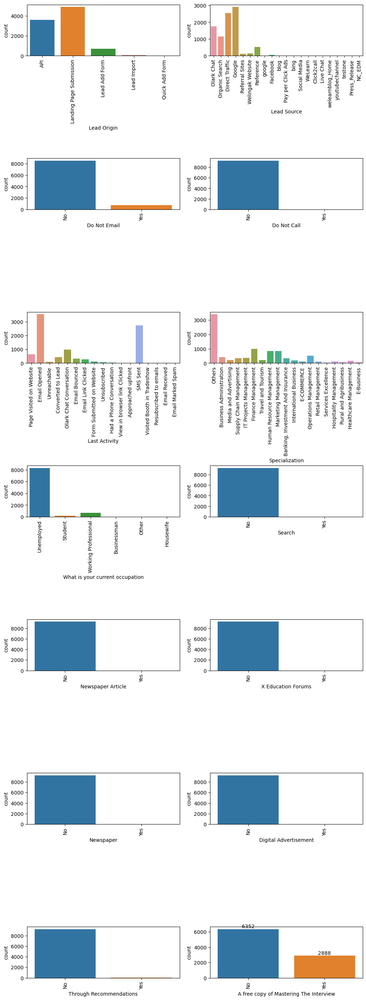

In [34]:
#Identify categorical columns
categorical_columns = df_leads.select_dtypes(include=['category', 'object']).columns.tolist()

#Calculate the number of rows needed for the subplots
nrows = len(categorical_columns) // 2
if len(categorical_columns) % 2 != 0:
    nrows += 1

#Configure the figure size and subplots
fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(12, 5 * nrows))
fig.subplots_adjust(wspace=0.2, hspace=2)

#Flatten axes for easy indexing
flat_axes = axes.flatten()

#Loop through each categorical column to plot
for idx, col in enumerate(categorical_columns):
    ax = flat_axes[idx]
    sns.countplot(x=col, data=df_leads, ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
#Annotate bars with their heights
for patch in ax.patches:
        ax.annotate('{:.0f}'.format(patch.get_height()), 
                    (patch.get_x() + patch.get_width() / 2., patch.get_height()),
                    ha='center', va='center', xytext=(0, 5), textcoords='offset points')

#Remove any extra empty subplots
for idx in range(len(categorical_columns), len(flat_axes)):
    fig.delaxes(flat_axes[idx])

#Show the plot
plt.show()

NOTE: 

The following columns have data that will not add any value to the model. It is recommended to drop the columns.
- 'Do Not Call',
- 'Search', 
- 'Newspaper Article',
- 'X Education Forums',
- 'Newspaper', 
- 'Digital Advertisement',
- 'Through Recommendations'. 

Additionally, skewed variables can affect the performance of logistic regression models as they can lead to biased or inaccurate parameter estimates.

In [35]:
#Drop categorical columns with highly skewed data

print("Before Drop: ",df_leads.shape)
df_leads.drop(['Do Not Call','Search','Newspaper Article','X Education Forums','Newspaper','Digital Advertisement','Through Recommendations'],axis=1,inplace=True)
print("After Drop: ",df_leads.shape)

Before Drop:  (9240, 18)
After Drop:  (9240, 11)


In [36]:
df_leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,A free copy of Mastering The Interview
0,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,No
1,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,No
2,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Yes
3,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,No
4,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,No


####  Data is clean from missing values.
Once the data is cleaned, it is recommended to standardize the values.

### 3.5. Perform Outlier Analysis

#### For Numerical Columns

In [37]:
def Check_Outliers(data,columnList):

    plt.figure(figsize=[22,11])
    plt.subplots_adjust(wspace=0.4,hspace=0.5)

    for i,j in enumerate(columnList):
        plt.subplot(2,2,i+1)

        sns.boxplot(y=data[j])     # y = df_leads[j] to make plot verticle

        plt.suptitle("\nChecking Outliers using Boxplot",fontsize=20,color="green")
        plt.ylabel(None)
        plt.title(j,fontsize=15,color='red')

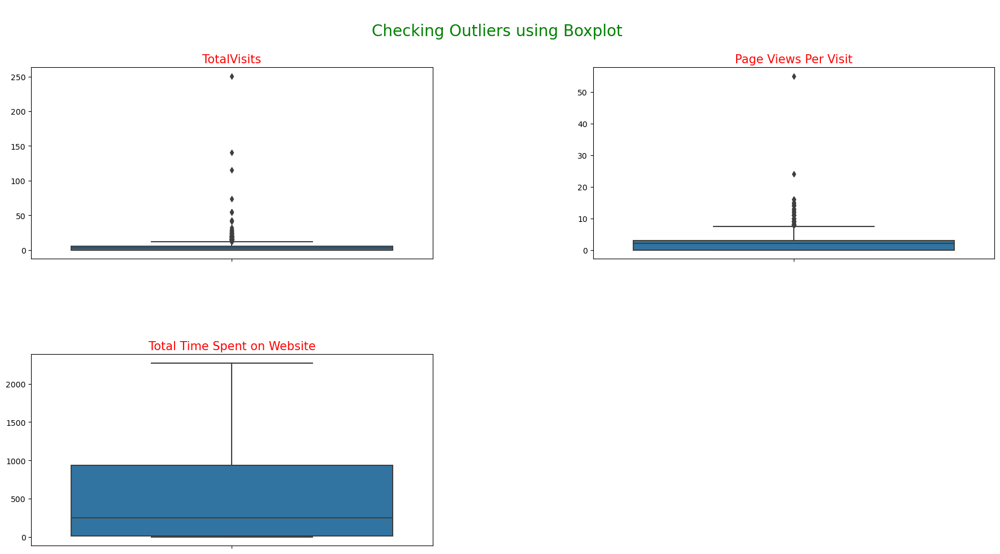

In [38]:
#Check outliers for numerical variables other than target variables
num_cols = ["TotalVisits","Page Views Per Visit","Total Time Spent on Website"]

#UDF 
Check_Outliers(df_leads,num_cols)

'TotalVisits', 'Page Views Per Visit': Both variables contain outliers, as can be seen in the boxplot.
Hence, these outliers need to be treated for these variables.

#### Capping Outliers for the treatment

In [39]:
#Before outlier treatment
df_leads.describe(percentiles=[.10,.25,.50,.75,.95])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000
mean,0.385390,3.394156,487.698268,2.327787
std,0.486714,4.836682,548.021466,2.164258
min,0.000000,0.000000,0.000000,0.000000
10%,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,12.000000,0.000000
50%,0.000000,3.000000,248.000000,2.000000
75%,1.000000,5.000000,936.000000,3.000000
95%,1.000000,10.000000,1562.000000,6.000000
max,1.000000,251.000000,2272.000000,55.000000


In [40]:
#Define UDF to treat outliers via capping and flooring
def Outlier_treatment(df,columnList):
    for i in columnList:
        q1 = df[i].describe()["25%"]
        q3 = df[i].describe()["75%"]
        IQR = q3 - q1

        upper_bound = q3 + 1.5*IQR
        lower_bound = q1 - 1.5*IQR

        #Capping upper_bound
        df[i] = np.where(df[i] > upper_bound, upper_bound,df[i])

        #Flooring lower_bound
        df[i] = np.where(df[i] < lower_bound, lower_bound,df[i])  

In [41]:
#Check outliers for numerical variables other than target variables 
capping_cols = ["TotalVisits","Page Views Per Visit"]

#UDF 
Outlier_treatment(df_leads,capping_cols)

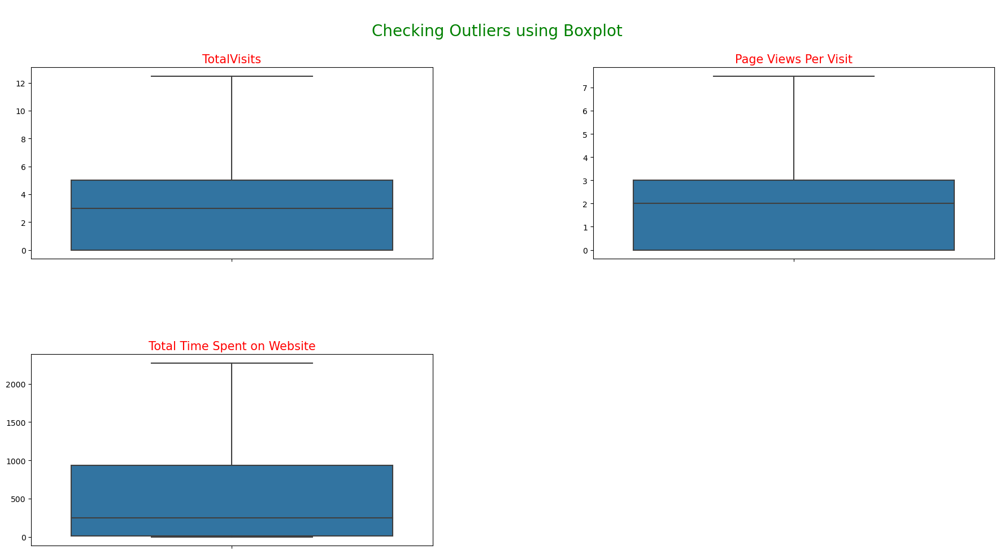

In [42]:
#Check boxgraph after outlier treatment
num_cols = ["TotalVisits","Page Views Per Visit","Total Time Spent on Website"]

#UDF for boxgraph
Check_Outliers(df_leads,num_cols)

In [43]:
#After outlier treatment, the details of percentile values are as follows
df_leads.describe(percentiles=[.10,.25,.50,.75,.95])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000
mean,0.385390,3.213853,487.698268,2.274987
std,0.486714,3.005136,548.021466,1.917776
min,0.000000,0.000000,0.000000,0.000000
10%,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,12.000000,0.000000
50%,0.000000,3.000000,248.000000,2.000000
75%,1.000000,5.000000,936.000000,3.000000
95%,1.000000,10.000000,1562.000000,6.000000
max,1.000000,12.500000,2272.000000,7.500000


### 3.6. Fix Invalid Values and Standardize Data in Columns

- Check whether entries in data are in correct format/ casing styles (UPPER, lower) or not.
- Check data types of columns.

In [44]:
df_leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,A free copy of Mastering The Interview
0,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,No
1,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,No
2,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Yes
3,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,No
4,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,No


In [45]:
#Display categorical variables 

columnsList_cat = ["Lead Origin","Lead Source","Do Not Email","Last Activity","Specialization",
                  "What is your current occupation","A free copy of Mastering The Interview"]

for i in columnsList_cat:
        perc=100*df_leads[i].value_counts(normalize=True)
        print("value_counts % for :",i,"\n")
        print(perc,"\n")
        print("_"*30,"\n")

value_counts % for : Lead Origin 

Landing Page Submission    52.878788
API                        38.744589
Lead Add Form               7.770563
Lead Import                 0.595238
Quick Add Form              0.010823
Name: Lead Origin, dtype: float64 

______________________________ 

value_counts % for : Lead Source 

Google               31.428571
Direct Traffic       27.521645
Olark Chat           18.993506
Organic Search       12.489177
Reference             5.779221
Welingak Website      1.536797
Referral Sites        1.352814
Facebook              0.595238
bing                  0.064935
google                0.054113
Click2call            0.043290
Press_Release         0.021645
Social Media          0.021645
Live Chat             0.021645
youtubechannel        0.010823
testone               0.010823
Pay per Click Ads     0.010823
welearnblog_Home      0.010823
WeLearn               0.010823
blog                  0.010823
NC_EDM                0.010823
Name: Lead Source, dtype:

NOTE:
- Some categories/ levels in the 'Lead Score' and 'Last Activity' columns have very few records. To prevent ending up with a bunch of unnecessary columns when creating dummy variables, it is planned to group these categories/ levels under 'Others', which will keep things neat and tidy.
- Also, 'Google' and 'google' are the same in the 'Lead Source' column, hence the case will be standardised.

#### 3.6.1. Group Values with Low Frequency

In [46]:
#Group low frequency value levels to 'Others'
df_leads['Lead Source'] = df_leads['Lead Source'].replace(["bing","Click2call","Press_Release",
                                                           "Social Media","Live Chat","youtubechannel",
                                                           "testone","Pay per Click Ads","welearnblog_Home",
                                                           "WeLearn","blog","NC_EDM"],"Others")

#Change 'google' to 'Google'
df_leads['Lead Source'] = df_leads['Lead Source'].replace("google","Google")

In [47]:
#After value replacement, calculate percentage
df_leads["Lead Source"].value_counts(normalize=True)*100

Google              31.482684
Direct Traffic      27.521645
Olark Chat          18.993506
Organic Search      12.489177
Reference            5.779221
Welingak Website     1.536797
Referral Sites       1.352814
Facebook             0.595238
Others               0.248918
Name: Lead Source, dtype: float64

In [48]:
#Group low frequency value levels to 'Others' 
df_leads['Last Activity'] = df_leads['Last Activity'].replace(['Unreachable','Unsubscribed',
                                                               'Had a Phone Conversation', 
                                                               'Approached upfront',
                                                               'View in browser link Clicked',       
                                                               'Email Marked Spam',                  
                                                               'Email Received','Visited Booth in Tradeshow',
                                                               'Resubscribed to emails'],'Others')

In [49]:
#After value replacement, calculate percentage
df_leads['Last Activity'].value_counts(normalize=True)*100

Email Opened                 38.311688
SMS Sent                     29.707792
Olark Chat Conversation      10.530303
Page Visited on Website       6.926407
Converted to Lead             4.632035
Email Bounced                 3.528139
Email Link Clicked            2.889610
Others                        2.218615
Form Submitted on Website     1.255411
Name: Last Activity, dtype: float64

In [50]:
#Rename column name to 'Free_copy' from 'A free copy of Mastering The Interview'
df_leads.rename(columns={'A free copy of Mastering The Interview': 'Free_copy'}, inplace=True)

#Rename column name to 'Current_occupation'
#from 'What is your current occupationA free copy of Mastering The Interview'
df_leads.rename(columns={'What is your current occupation': 'Current_occupation'}, inplace=True)

NOTE:
- Since both 'Do Not Email' and 'Free_copy' are both binary categorical columns, it is recommended to map both of them from 'Yes/No' values to 1/0.

#### 3.6.2. Map Binary Categorical Variables

In [51]:
#Map binary categorical variables (Yes/No to 1/0) 
df_leads['Do Not Email'] = df_leads['Do Not Email'].apply(lambda x: 1 if x =='Yes' else 0)

df_leads['Free_copy'] = df_leads['Free_copy'].apply(lambda x: 1 if x =='Yes' else 0)

#### 3.6.3. Check Data Types of Variables

In [52]:
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Lead Origin                  9240 non-null   object 
 1   Lead Source                  9240 non-null   object 
 2   Do Not Email                 9240 non-null   int64  
 3   Converted                    9240 non-null   int64  
 4   TotalVisits                  9240 non-null   float64
 5   Total Time Spent on Website  9240 non-null   int64  
 6   Page Views Per Visit         9240 non-null   float64
 7   Last Activity                9240 non-null   object 
 8   Specialization               9240 non-null   object 
 9   Current_occupation           9240 non-null   object 
 10  Free_copy                    9240 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 794.2+ KB


NOTE: The data types in the dataframe appear to be suitable, and no modifications are necessary.

## <strong><span style="color:brown">Step 4: Data Analysis (EDA)</span></strong>

### 4.1. Check whether Data is imbalanced or not
- Data is imbalanced when one value is present in majority and the other is in minority, indicating an uneven distribution of observations in the dataset.
- Data imbalance is in the context of the target variable only.
- The target variable is 'Converted' which tells whether a past lead was converted or not, where '1' means 'it was converted' and '0' means 'it was not converted'.

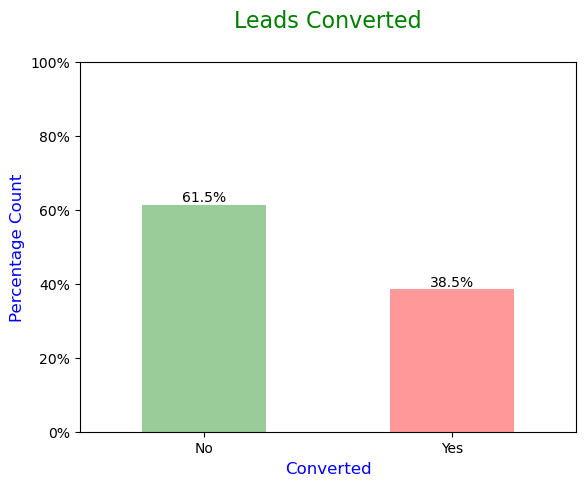

In [53]:
##Graph the results on bar graph
ax=(100*df_leads["Converted"].value_counts(normalize=True)).plot.bar(color=["Green","Red"],alpha=0.4)

#Add and format title
plt.title("Leads Converted\n", fontdict={'fontsize': 16, 'fontweight' : 12, 'color' : 'Green'})

#Label axes
plt.xlabel('Converted', fontdict={'fontsize': 12, 'fontweight' : 20, 'color' : 'Blue'})
plt.ylabel("Percentage Count", fontdict={'fontsize': 12, 'fontweight' : 20, 'color' : 'Blue'})

#Modify Y-axis ticks
ticks=np.arange(0,101,20)
labels=["{:.0f}%".format(i) for i in ticks] 
plt.yticks(ticks,labels)

#Modify X-axis ticks
plt.xticks([0,1],["No","Yes"])
plt.xticks(rotation=0)

for p in ax.patches:
    ax.annotate('{:.1f}%'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                  ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    
plt.show()

Insights:

The conversion rate is 38.5%, indicating that only 38.5% of the people have converted to leads. This is a minority, while 61.5% of the people did not convert to leads, which is a majority.

In [54]:
#Ratio of Data Imbalance
ratio=(df_leads["Converted"].value_counts(normalize=True).loc[0])/(df_leads["Converted"].value_counts(normalize=True).loc[1])

print("Data Imbalance Ratio : {:.2f} : {}".format(ratio,1))

Data Imbalance Ratio : 1.59 : 1


### 4.2. Perform Univariate Analysis

In [55]:
df_leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,Current_occupation,Free_copy
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,0
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,1
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Others,Media and Advertising,Unemployed,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,0


#### 4.2.1. Perform Univariate Analysis for Categorical Variables

In [56]:
#List categorical columns
cat_cols = ["Lead Origin","Current_occupation","Do Not Email",
            "Free_copy","Lead Source","Last Activity","Specialization"]

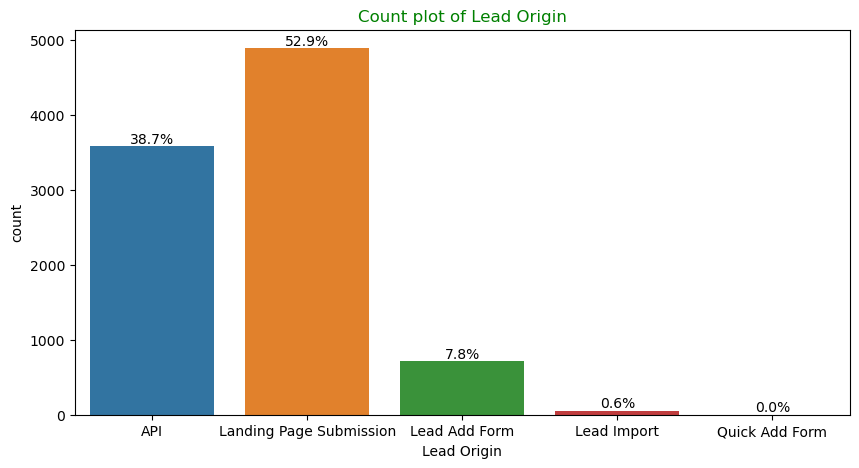

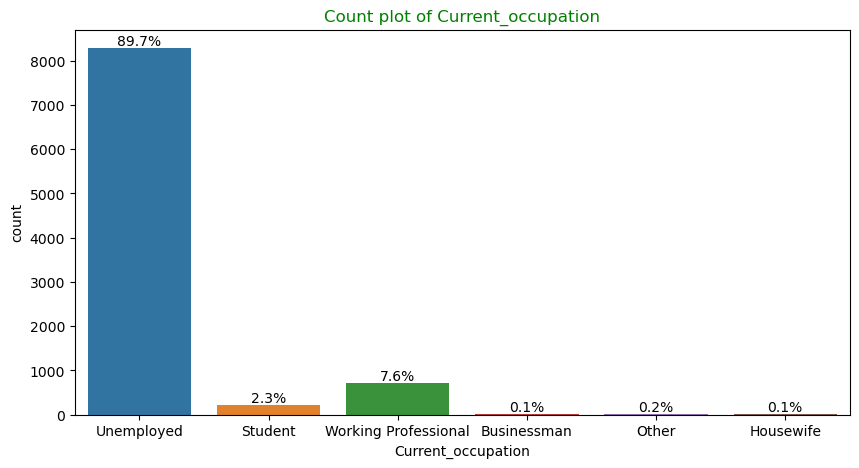

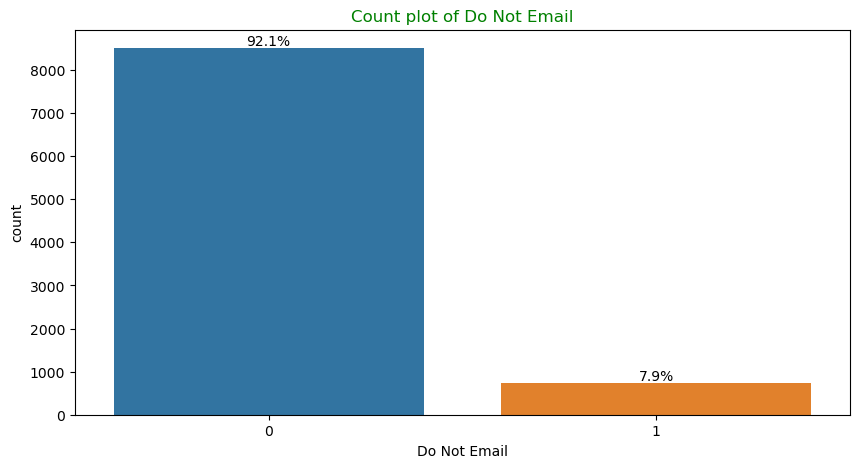

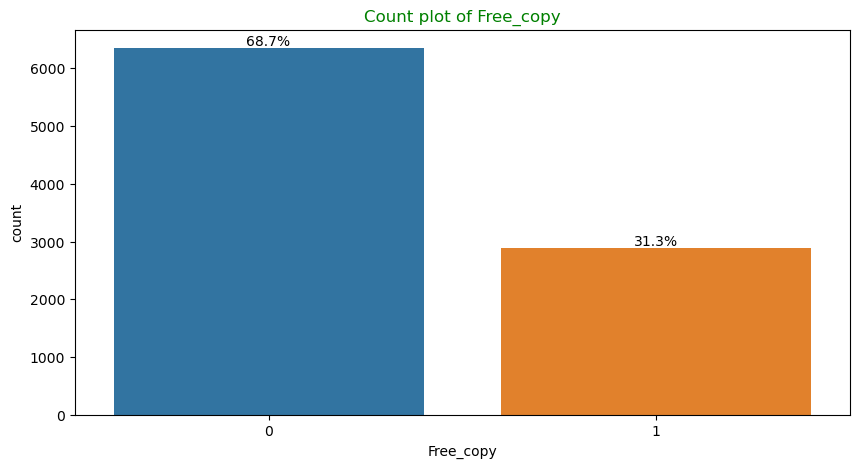

In [57]:
#Display countgraph of columns with its value_counts percentage as annotation
for i in cat_cols[:4]:
    
    plt.figure(figsize=[10,5])
    plt.title("Count plot of {}".format(i),color="green")
    ax=sns.countplot(x=i,data=df_leads)
    total=len(df_leads[i])
    plt.xticks(rotation=0)
    
    for p in ax.patches:
        text = '{:.1f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width() / 2.
        y = p.get_height()
        
        ax.annotate(text, (x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

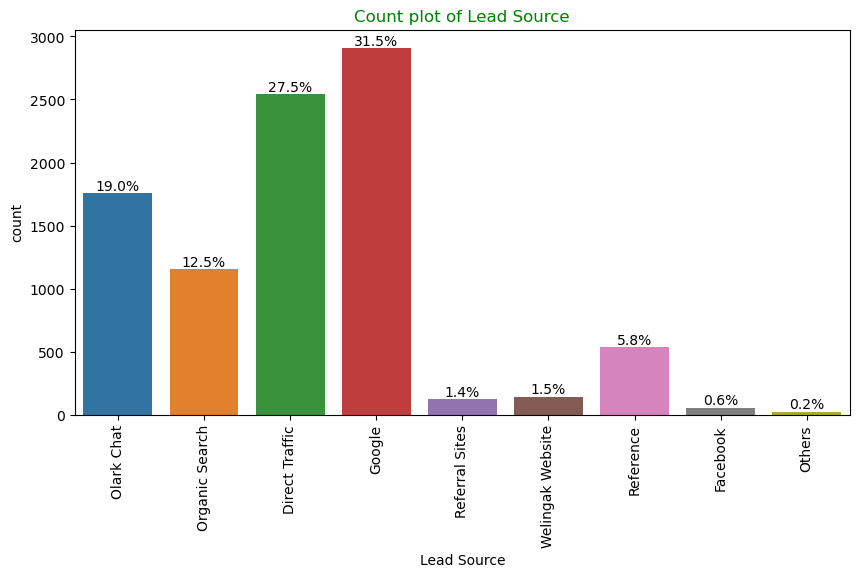

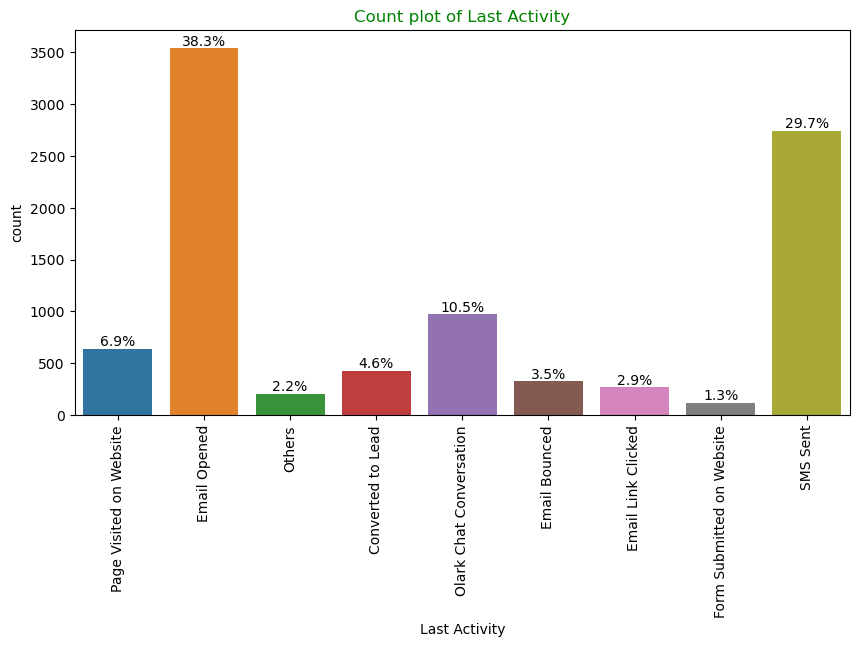

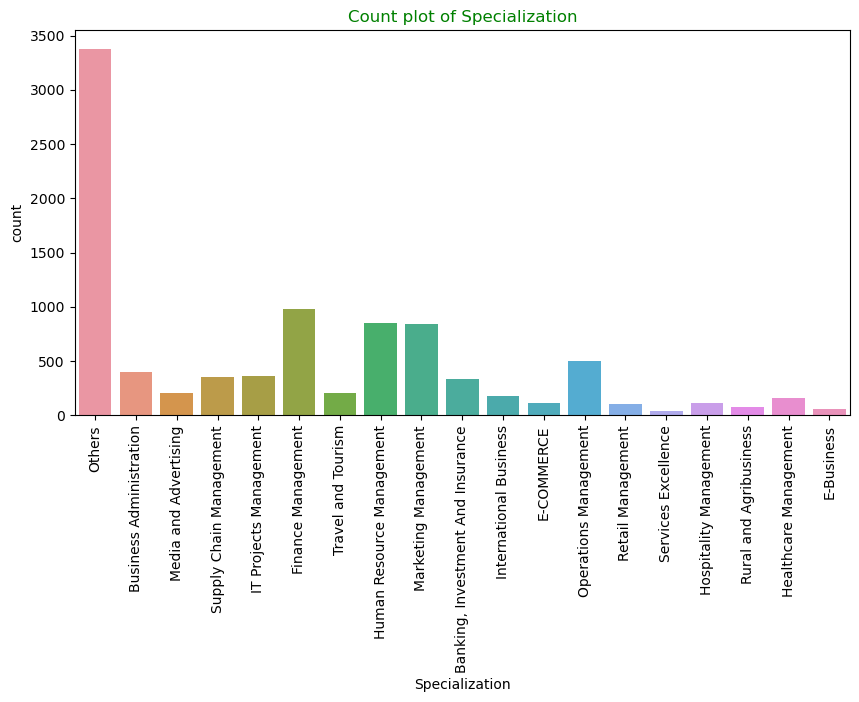

In [58]:
#Display barplot for remaining columns from cat_cols
for i in cat_cols[4:]:
    
    plt.figure(figsize=[10,5])
    plt.title("Count plot of {}".format(i),color="green")
    ax=sns.countplot(x=i,data=df_leads)
    total=len(df_leads[i])
    plt.xticks(rotation=90)
    
    
    if i!="Specialization":        #(not doing for Specialization xtick labels will be messy)
        for p in ax.patches:
            text = '{:.1f}%'.format(100*p.get_height()/total)
            x = p.get_x() + p.get_width() / 2.
            y = p.get_height()

            ax.annotate(text, (x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    else:
        pass

Observations:

In Categorical Univariate Analysis, the percentage distribution of values in each column for each variable is specified, providing some understanding on which variables can be used in Bivariate Analysis.

Insights Univariate:

Following is the list of features from variables which are present in majority ('Converted' and 'Not Converted' are included). 

- Lead Origin: 'Landing Page Submission' identified 52.8% customers, and 'API' identified 38.7%. 
- Current_occupation: 89.7% of the customers are 'Unemployed'.
- Do Not Email: 92.1% of the people has opted not to be emailed about the course.
- Lead Source: 31.5% of lead sources are from 'Google' and 27.5% are from 'Direct Traffic'.
- Last Activity: 29.7% of customers are contributed from 'SMS Sent' and 38.3% are from 'Email Opened' activities.

NOTE: 

These insights can be used to determine which variables can be used in Bivariate Analysis.

### 4.3. Perform Bivariate Analysis
Bivariate analysis is a statistical analysis that involves studying the relationship between two variables.

#### 4.3.1. Perform Bivariate Analysis for Categorical Variables

In [59]:
#UDF 'Bivariate_cat' tells comparision between Actual Distribution (value_count percentage) 
#from the data and the 2nd graph tells the Lead Conversion Rate in percentage 
#(how much leads are converted from the 1st graph distribution)

def Bivariate_cat(df,variable_name,Target="Converted"):
    plt.figure(figsize=(20,6))
    plt.suptitle("{} Countplot vs Lead Conversion Rates".format(variable_name),color="Red", fontsize=18)
    
    #The 1st graph
    plt.subplot(1,2,1)
    plt.title("Distribution of {}".format(variable_name),color="blue")
    ax=sns.countplot(x=variable_name,hue=Target,data=df_leads,palette="prism_r",alpha=0.46)
    
    total=len(df_leads[variable_name])
    plt.xticks(rotation=90)
    plt.legend(["No","Yes"],title = "Converted")
    
    #Annotation for the 1st graph        
    for p in ax.patches:
        text = '{:.1f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width() / 2.
        y = p.get_height()

        ax.annotate(text, (x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

    #The 2nd graph
    plt.subplot(1,2,2)
    plt.title("Lead Conversion Rate of {}".format(variable_name),color="green",fontsize=12)
    ax=sns.countplot(x=variable_name,hue=Target,data=df,palette="coolwarm",alpha=0.85)   #ax1 is for annotation
    
    #Modifications
    plt.xticks(rotation=90)
    plt.ylabel("Count",color='Red')
    plt.xlabel("{}".format(variable_name))
    plt.legend(labels=["Not Converted","Converted"],title = "Lead Conversion Rate")
    
    #Annotation for the 2nd graph
    #Calculate percentage above bars in countgraph (Conversion rate)
    all_heights = [[p.get_height() for p in bars] for bars in ax.containers]
    for bars in ax.containers:
        for i, p in enumerate(bars):
            total = sum(xgroup[i] for xgroup in all_heights)
            percentage = f'{(100 * p.get_height() / total) :.1f}%'
            ax.annotate(percentage, (p.get_x() + p.get_width() / 2, p.get_height()), size=11, ha='center', va='bottom')

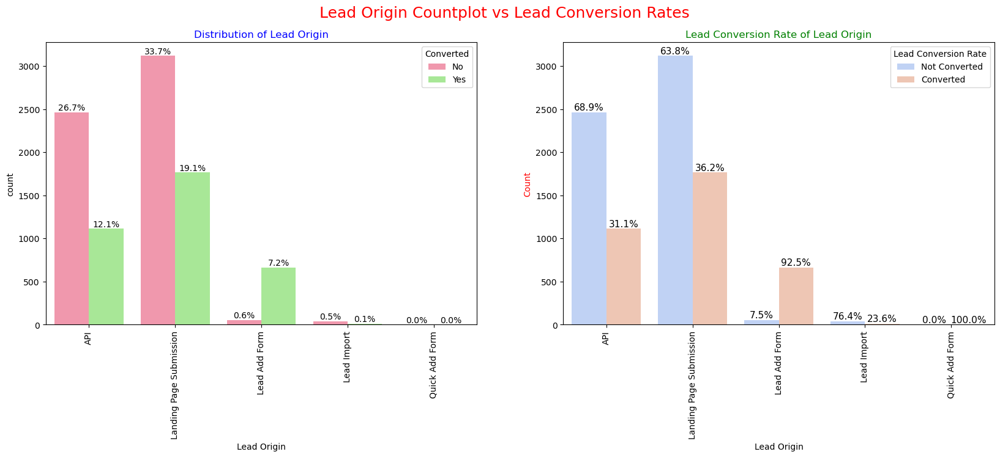

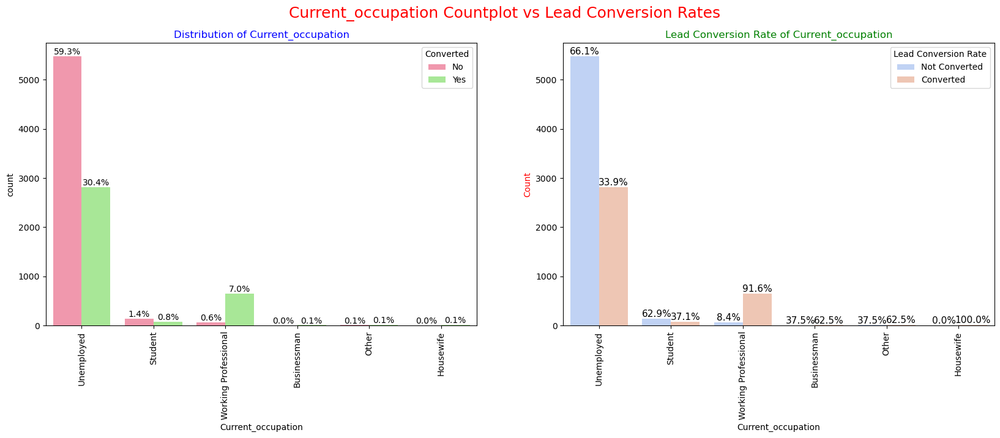

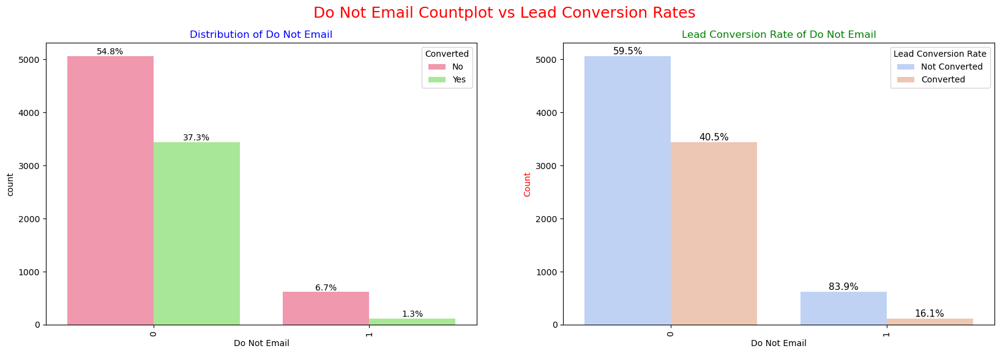

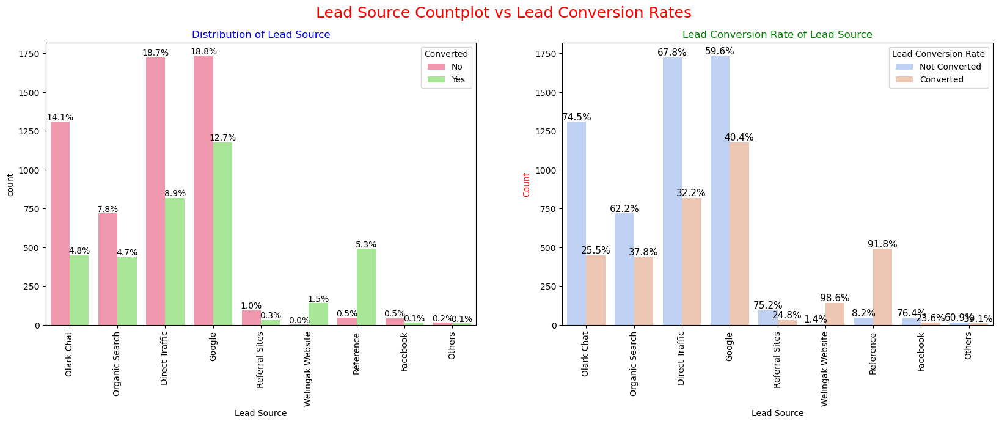

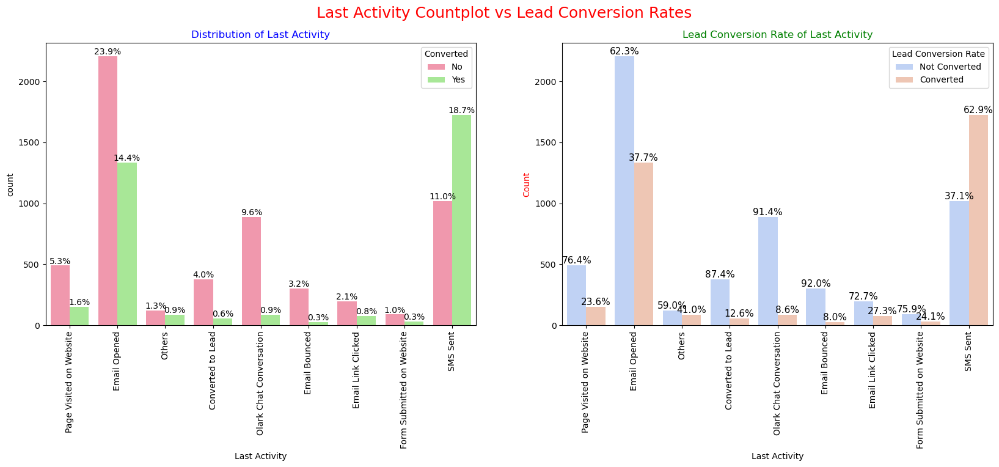

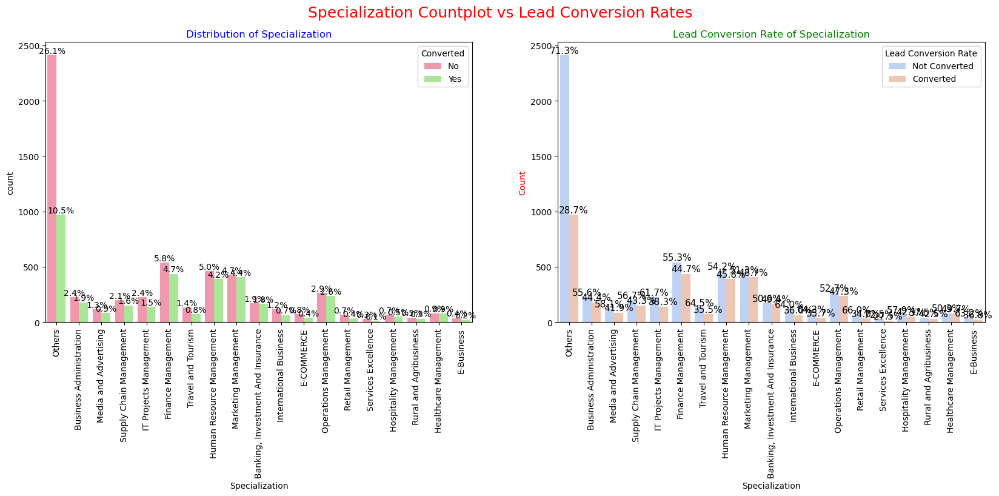

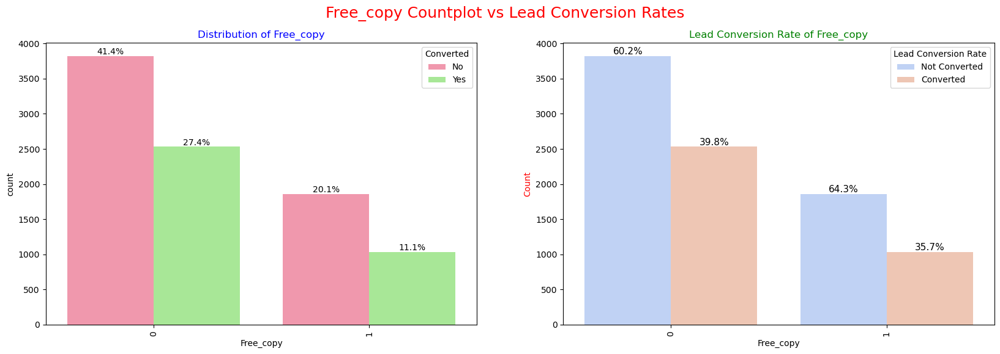

In [60]:
#Bivariate Analysis for all these variables using loop and UDF
#Comparision between variables with respect to 'Converted' (Target variable),
#taking one categorical column with respect to target variable as 'hue'
cat_cols = ["Lead Origin","Current_occupation","Do Not Email",
            "Lead Source","Last Activity","Specialization","Free_copy"]

for i in cat_cols:
    Bivariate_cat(df_leads,variable_name=i)

Insights:
- Lead Origin: Roughly 52.8% of all leads originated from 'Landing Page Submission' with a lead conversion rate (LCR) of 36.2%.The 'API' identified 38.8% of customers with a lead conversion rate (LCR) of 31.1%.

- Current_occupation: Roughly 89.7% of customers are 'Unemployed' with a lead conversion rate (LCR) of 33.9%. 'Working Professional' contributes only 7.6% of total customers with a lead conversion rate (LCR) of almost 91.6%.

- Do Not Email: 92.1% of the people have opted not to be emailed about the course. 

LCR is assumed as Lead Conversion Rate in short form.

- Lead Source: 'Google' has LCR of 40.4% and contributes 31.5% of customers, 'Direct Traffic' has LCR of 32.2% and contributes 27.6% of customers (which is lower than 'Google'), 'Organic Search' has LCR of 37.8% and contributes only 12.5% of customers, 'Reference' has LCR of 91.8% and contributes only roughly 5.8% of customers through this Lead Source.

- Last Activity: The 'SMS Sent' activity has a high lead conversion rate of 62.9% with 29.7% contribution from last activities performed by customers, while the 'Email Opened' activity has a lead conversion rate of 37.7% with 38.3% contribution.

- Specialization: Finance Management, HR Management, and Marketing Management show good contribution.

#### 4.3.2. Perform Bivariate Analysis for Numerical Variables

<Figure size 1600x400 with 0 Axes>

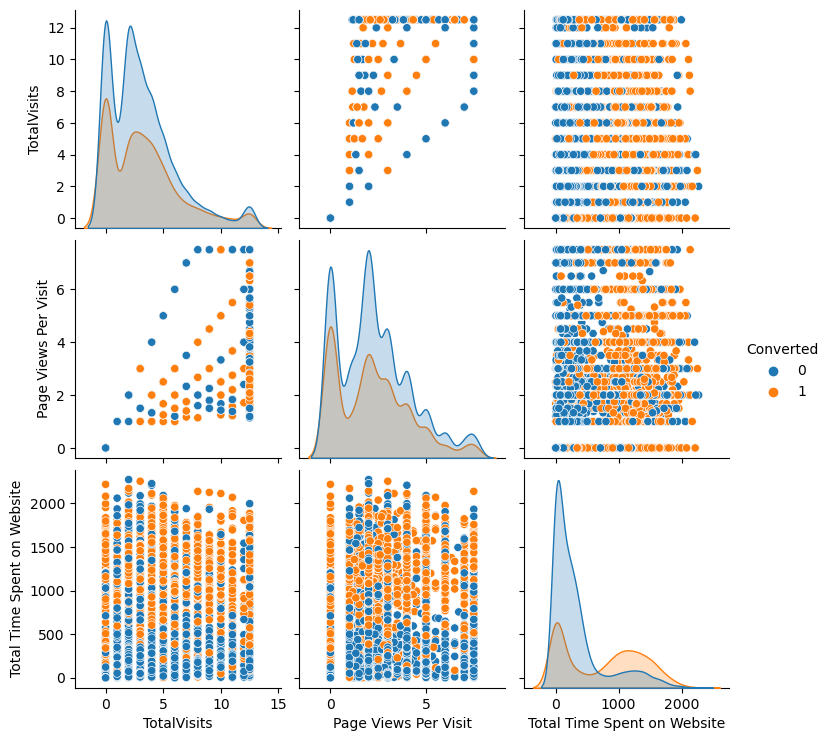

In [61]:
plt.figure(figsize=(16, 4))
sns.pairplot(data=df_leads,vars=num_cols,hue="Converted")                                  
plt.show()

In [62]:
num_cols =["Converted",'TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']

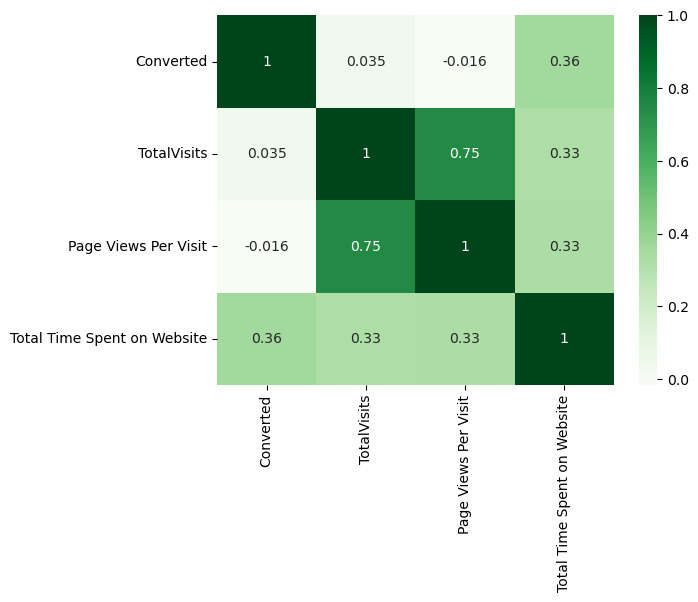

In [63]:
#Display heatmap to show correlation between numerical variables
sns.heatmap(data=df_leads[num_cols].corr(),cmap="Greens",annot=True)
plt.show()

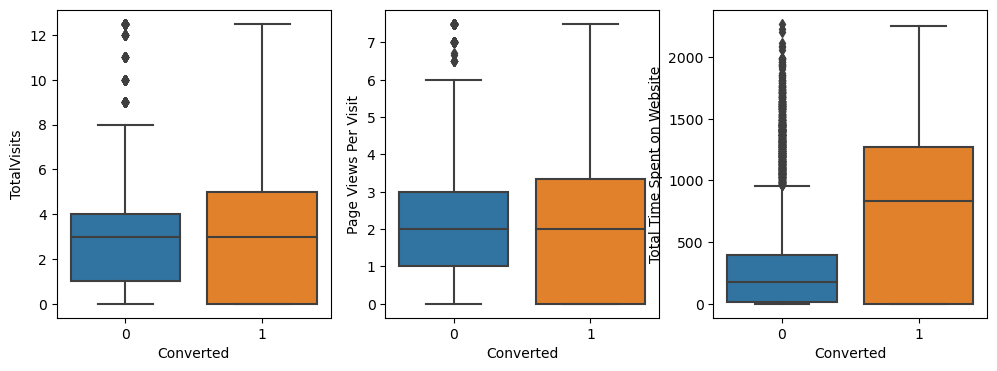

In [64]:
#Display boxgraph with 'Converted' as 'hue'
plt.figure(figsize=(12, 4))
plt.subplot(1,3,1)
sns.boxplot(y = 'TotalVisits', x = 'Converted', data = df_leads)
plt.subplot(1,3,2)
sns.boxplot(y = 'Page Views Per Visit', x = 'Converted', data = df_leads)
plt.subplot(1,3,3)
sns.boxplot(y = 'Total Time Spent on Website', x = 'Converted', data = df_leads)
plt.show()

Insights:

Past Leads who spend more time on the website are more likely to be successfully converted than those who spend less time, as seen in th boxplot.

## Step 5: Data Preparation

### 5.1. Dummy Variables

For categorical variables with multiple levels, create dummy features (using one-hot encoding).

#### Binary level categorical columns are already mapped to 1 / 0 in previous steps, so start with dummy variable creation.

In [65]:
df_leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,Current_occupation,Free_copy
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,0
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,1
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Others,Media and Advertising,Unemployed,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,0


In [66]:
#Create a dummy variable for some of the categorical variables and drop the first one
dummy = pd.get_dummies(df_leads[["Lead Origin","Lead Source","Last Activity","Specialization","Current_occupation"]], drop_first=True)

# Add the results to the master dataframe
df_leads = pd.concat([df_leads, dummy], axis=1)

In [67]:
df_leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,Current_occupation,Free_copy,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Current_occupation_Housewife,Current_occupation_Other,Current_occupation_Student,Current_occupation_Unemployed,Current_occupation_Working Professional
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Others,Media and Advertising,Unemployed,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [68]:
#Create dummies for the below variables and drop them
df_leads = df_leads.drop(["Lead Origin", "Lead Source", "Last Activity", "Specialization", "Current_occupation"], axis=1)

In [69]:
df_leads.shape

(9240, 49)

In [70]:
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 49 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Do Not Email                              9240 non-null   int64  
 1   Converted                                 9240 non-null   int64  
 2   TotalVisits                               9240 non-null   float64
 3   Total Time Spent on Website               9240 non-null   int64  
 4   Page Views Per Visit                      9240 non-null   float64
 5   Free_copy                                 9240 non-null   int64  
 6   Lead Origin_Landing Page Submission       9240 non-null   uint8  
 7   Lead Origin_Lead Add Form                 9240 non-null   uint8  
 8   Lead Origin_Lead Import                   9240 non-null   uint8  
 9   Lead Origin_Quick Add Form                9240 non-null   uint8  
 10  Lead Source_Facebook                

## Step 6: Test-Train Split

In [71]:
#Put predictor variables to X
X = df_leads.drop('Converted', axis=1)

#Put target variables to y
y = df_leads["Converted"]

In [72]:
#Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [73]:
print("X_train:", X_train.shape,"\ny_train:",y_train.shape)

X_train: (6468, 48) 
y_train: (6468,)


In [74]:
print("X_test:", X_test.shape,"\ny_test:",y_test.shape)

X_test: (2772, 48) 
y_test: (2772,)


## Step 7: Feature Scaling

In [75]:
#Use standard scaler for scaling the features
scaler = StandardScaler()

#Fetch 'int64' and 'float64' dtype columns from dataframe for scaling
num_cols=X_train.select_dtypes(include=['int64','float64']).columns

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

In [76]:
#X-train dataframe after standard scaling
X_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Free_copy,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Current_occupation_Housewife,Current_occupation_Other,Current_occupation_Student,Current_occupation_Unemployed,Current_occupation_Working Professional
1871,-0.291638,-1.064974,-0.885371,-1.184892,-0.673169,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
6795,-0.291638,0.262370,0.005716,-0.488713,1.485511,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3516,-0.291638,0.594206,-0.691418,0.123715,-0.673169,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8105,-0.291638,0.594206,1.365219,1.432322,-0.673169,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
3934,-0.291638,-1.064974,-0.885371,-1.184892,-0.673169,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [77]:
#Check the Lead Conversion Rate (LCR) - 'Converted' is our Target Variable
#Denote Lead Conversion Rate with 'LCR' as its short form
LCR = (sum(df_leads['Converted'])/len(df_leads['Converted'].index))*100
LCR

38.53896103896104

NOTE: 

The Lead Conversion Rate is 38.53%. 

### 7.1. Look at Correlations

Perform feature elimination based on correlations.

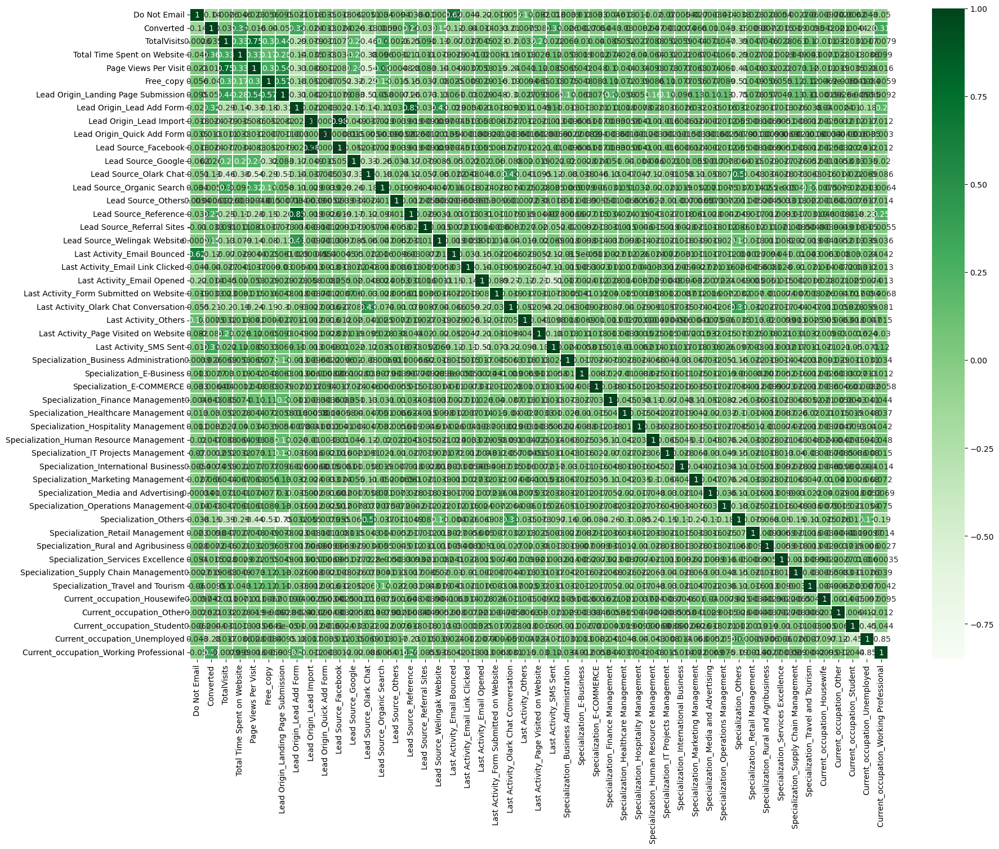

In [78]:
#Analyze correlation matrix
plt.figure(figsize = (20,15))        
sns.heatmap(df_leads.corr(),linewidths=0.01,cmap="Greens",annot=True)
plt.show()

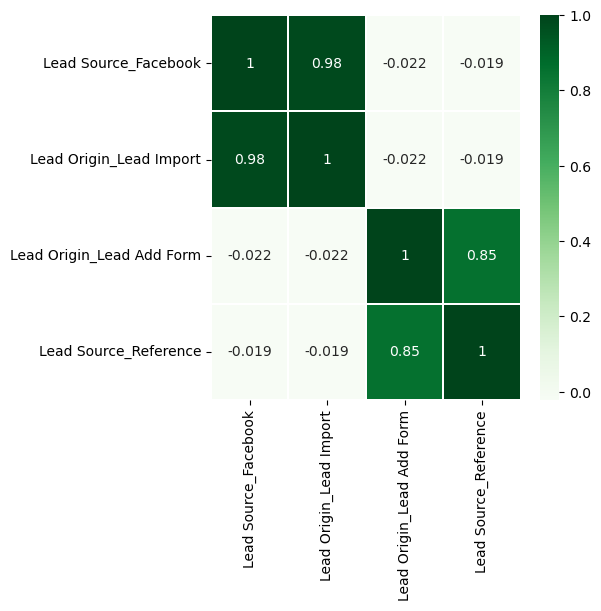

In [79]:
#Due to the above heatmap's large number of columns, break down suspected variables 
#which might have high correlation with one another
#Variables might be highly correlated with one another from a same class from the above graph
plt.figure(figsize = (5,5))        
sns.heatmap(df_leads[["Lead Source_Facebook","Lead Origin_Lead Import","Lead Origin_Lead Add Form","Lead Source_Reference"]].corr(),linewidths=0.01,cmap="Greens",annot=True)
plt.show()

NOTE: 

Noting that these predictor variables above are very highly diagonally-correlated with one another (0.98 and 0.85), it is preferable to remove one of these variables from each pair as they do not significantly contribute to the model. Hence, it is recommended to drop any of them, 'Lead Origin_Lead Import' and 'Lead Origin_Lead Add Form'.

In [80]:
X_test = X_test.drop(['Lead Origin_Lead Import', 'Lead Origin_Lead Add Form'], axis=1)
X_train = X_train.drop(['Lead Origin_Lead Import', 'Lead Origin_Lead Add Form'], axis=1)

## Step 8: Model Building
- Build Logistic Regression Model to predict categorical variables.
- Feature Selection Using RFE (coarse tuning).
- Manually fine-tuning using p-values and VIFs.

### 8.1. Feature Selection using RFE (Recursive Feature Elimination)

In [81]:
#Use RFE to reduce variables 
logreg = LogisticRegression()
rfe = RFE(logreg, n_features_to_select=15)            
rfe = rfe.fit(X_train, y_train)

In [82]:
#Check the output of RFE
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', False, 11),
 ('TotalVisits', False, 9),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 10),
 ('Free_copy', False, 18),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Quick Add Form', False, 19),
 ('Lead Source_Facebook', True, 1),
 ('Lead Source_Google', False, 22),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 28),
 ('Lead Source_Others', True, 1),
 ('Lead Source_Reference', True, 1),
 ('Lead Source_Referral Sites', False, 24),
 ('Lead Source_Welingak Website', True, 1),
 ('Last Activity_Email Bounced', False, 14),
 ('Last Activity_Email Link Clicked', False, 6),
 ('Last Activity_Email Opened', True, 1),
 ('Last Activity_Form Submitted on Website', False, 29),
 ('Last Activity_Olark Chat Conversation', True, 1),
 ('Last Activity_Others', True, 1),
 ('Last Activity_Page Visited on Website', False, 12),
 ('Last Activity_SMS Sent', True, 1),
 ('Specialization_Business Administration', False, 

In [83]:
#Instead of using as 'zip', using following approach for better readablility
#Check the top 15 features chosen by RFE
top15=pd.DataFrame()
top15['features']=X_train.columns
top15['Feature Chosen'] = rfe.support_
top15['Ranking']=rfe.ranking_
top15.sort_values(by='Ranking')

,features,Feature Chosen,Ranking
22,Last Activity_SMS Sent,True,1
41,Current_occupation_Housewife,True,1
35,Specialization_Others,True,1
28,Specialization_Hospitality Management,True,1
20,Last Activity_Others,True,1
19,Last Activity_Olark Chat Conversation,True,1
17,Last Activity_Email Opened,True,1
14,Lead Source_Welingak Website,True,1
12,Lead Source_Reference,True,1
11,Lead Source_Others,True,1


In [84]:
#Columns which are selected by RFE
rfe_col = X_train.columns[rfe.support_]
rfe_col

Index(['Total Time Spent on Website', 'Lead Origin_Landing Page Submission',
       'Lead Source_Facebook', 'Lead Source_Olark Chat', 'Lead Source_Others',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'Last Activity_Email Opened', 'Last Activity_Olark Chat Conversation',
       'Last Activity_Others', 'Last Activity_SMS Sent',
       'Specialization_Hospitality Management', 'Specialization_Others',
       'Current_occupation_Housewife',
       'Current_occupation_Working Professional'],
      dtype='object')

In [85]:
#Columns which are not selected by RFE
X_train.columns[~rfe.support_]

Index(['Do Not Email', 'TotalVisits', 'Page Views Per Visit', 'Free_copy',
       'Lead Origin_Quick Add Form', 'Lead Source_Google',
       'Lead Source_Organic Search', 'Lead Source_Referral Sites',
       'Last Activity_Email Bounced', 'Last Activity_Email Link Clicked',
       'Last Activity_Form Submitted on Website',
       'Last Activity_Page Visited on Website',
       'Specialization_Business Administration', 'Specialization_E-Business',
       'Specialization_E-COMMERCE', 'Specialization_Finance Management',
       'Specialization_Healthcare Management',
       'Specialization_Human Resource Management',
       'Specialization_IT Projects Management',
       'Specialization_International Business',
       'Specialization_Marketing Management',
       'Specialization_Media and Advertising',
       'Specialization_Operations Management',
       'Specialization_Retail Management',
       'Specialization_Rural and Agribusiness',
       'Specialization_Services Excellence',
      

In [86]:
#User defines function for calculating VIFs for variables
def get_vif(model_df):
    X = pd.DataFrame()
    X['Features'] = model_df.columns
    X['VIF'] = [variance_inflation_factor(model_df.values, i) for i in range(model_df.shape[1])]
    X['VIF'] = round(X['VIF'], 2)
    X = X.sort_values(by='VIF', ascending=False)
    X = X.reset_index(drop=True)
    return X

In [87]:
X_train[rfe_col] = X_train[rfe_col].astype(float)

### Model 1

In [88]:
#Build model using statsmodels, for the detailed statistics

#Columns selected by RFE to be used for this model 
rfe_col=X_train.columns[rfe.support_]

#Create X_train dataframe with variables selected by RFE
X_train_rfe = X_train[rfe_col]

#Add a constant variable 
X_train_sm1 = sm.add_constant(X_train_rfe)

#Create a fitted model
logm1 = sm.GLM(y_train,X_train_sm1,family = sm.families.Binomial()).fit()  

logm1.params

const                                      -1.033284
Total Time Spent on Website                 1.050544
Lead Origin_Landing Page Submission        -1.272090
Lead Source_Facebook                       -0.696059
Lead Source_Olark Chat                      0.900083
Lead Source_Others                          0.980708
Lead Source_Reference                       2.897685
Lead Source_Welingak Website                5.380227
Last Activity_Email Opened                  0.950623
Last Activity_Olark Chat Conversation      -0.553411
Last Activity_Others                        1.258012
Last Activity_SMS Sent                      2.068763
Specialization_Hospitality Management      -1.072037
Specialization_Others                      -1.193681
Current_occupation_Housewife               23.022209
Current_occupation_Working Professional     2.685466
dtype: float64

In [89]:
#Observe the summary of the logistic regression model
print(logm1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6452
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2732.8
Date:                Sat, 14 Oct 2023   Deviance:                       5465.5
Time:                        22:36:00   Pearson chi2:                 8.09e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.3839
Covariance Type:            nonrobust                                         
                                              coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

NOTE: 

The 'Current_occupation_Housewife' column will be removed from the model due to a high p-value of 0.999, which is above the accepted threshold of 0.05 for statistical significance.

The 'Current_occupation_Housewife' column will be removed from the model due to a high p-value of 0.999, which is above the accepted threshold of 0.05 for statistical significance.

### Model 2

In [90]:
#Drop the 'Current_occupation_Housewife' column
rfe_col=rfe_col.drop("Current_occupation_Housewife")

In [91]:
#Create X_train dataframe with variables selected by RFE
X_train_rfe = X_train[rfe_col]

#Add a constant variable 
X_train_sm2 = sm.add_constant(X_train_rfe)

#Create a fitted model
logm2 = sm.GLM(y_train,X_train_sm2,family = sm.families.Binomial()).fit()  

logm2.params

const                                     -1.025075
Total Time Spent on Website                1.049364
Lead Origin_Landing Page Submission       -1.267369
Lead Source_Facebook                      -0.696913
Lead Source_Olark Chat                     0.899051
Lead Source_Others                         0.973897
Lead Source_Reference                      2.917123
Lead Source_Welingak Website               5.379144
Last Activity_Email Opened                 0.949036
Last Activity_Olark Chat Conversation     -0.558345
Last Activity_Others                       1.248172
Last Activity_SMS Sent                     2.058828
Specialization_Hospitality Management     -1.079528
Specialization_Others                     -1.197801
Current_occupation_Working Professional    2.677350
dtype: float64

In [92]:
#Observe the summary of the logistic regression model
print(logm2.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6453
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2740.3
Date:                Sat, 14 Oct 2023   Deviance:                       5480.7
Time:                        22:36:00   Pearson chi2:                 8.12e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3825
Covariance Type:            nonrobust                                         
                                              coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

NOTE:

The 'Lead Source_Facebook' column will be removed from the model due to a high p-value of 0.187, which is above the accepted threshold of 0.05 for statistical significance.

### Model 3

In [93]:
#Drop the 'Lead Source_Facebook' column
rfe_col=rfe_col.drop("Lead Source_Facebook")

In [94]:
#Create X_train dataframe with variables selected by RFE
X_train_rfe = X_train[rfe_col]

#Add a constant variable 
X_train_sm3 = sm.add_constant(X_train_rfe)

#Create a fitted model
logm3 = sm.GLM(y_train,X_train_sm3,family = sm.families.Binomial()).fit()  

logm3.params

const                                     -1.040542
Total Time Spent on Website                1.051824
Lead Origin_Landing Page Submission       -1.249311
Lead Source_Olark Chat                     0.916940
Lead Source_Others                         0.981395
Lead Source_Reference                      2.937179
Lead Source_Welingak Website               5.396676
Last Activity_Email Opened                 0.943420
Last Activity_Olark Chat Conversation     -0.558250
Last Activity_Others                       1.248700
Last Activity_SMS Sent                     2.055550
Specialization_Hospitality Management     -1.090368
Specialization_Others                     -1.194330
Current_occupation_Working Professional    2.675678
dtype: float64

In [95]:
#Observe the summary of the logistic regression model
print(logm3.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6454
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2741.3
Date:                Sat, 14 Oct 2023   Deviance:                       5482.6
Time:                        22:36:01   Pearson chi2:                 8.12e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3823
Covariance Type:            nonrobust                                         
                                              coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

NOTE:
The 'Lead Source_Others' column will be removed from the model due to a high p-value of 0.055, which is above the accepted threshold of 0.05 for statistical significance.

### Model 4

In [96]:
#Drop the 'Lead Source_Others' column
rfe_col=rfe_col.drop("Lead Source_Others")

In [97]:
#Create X_train dataframe with variables selected by RFE
X_train_rfe = X_train[rfe_col]

#Add a constant variable 
X_train_sm4 = sm.add_constant(X_train_rfe)

#Create a fitted model
logm4 = sm.GLM(y_train,X_train_sm4,family = sm.families.Binomial()).fit()  

logm4.params

const                                     -1.023594
Total Time Spent on Website                1.049789
Lead Origin_Landing Page Submission       -1.258954
Lead Source_Olark Chat                     0.907184
Lead Source_Reference                      2.925326
Lead Source_Welingak Website               5.388662
Last Activity_Email Opened                 0.942099
Last Activity_Olark Chat Conversation     -0.555605
Last Activity_Others                       1.253061
Last Activity_SMS Sent                     2.051879
Specialization_Hospitality Management     -1.094445
Specialization_Others                     -1.203333
Current_occupation_Working Professional    2.669665
dtype: float64

In [98]:
#Observe the summary of the logistic regression model
print(logm4.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6455
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2743.1
Date:                Sat, 14 Oct 2023   Deviance:                       5486.1
Time:                        22:36:01   Pearson chi2:                 8.11e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3819
Covariance Type:            nonrobust                                         
                                              coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

NOTE: 

Model 4 is stable and has significant p-values within the threshold (p-values < 0.05), so it is preferable to be used for further analysis.

Now, check VIFs for these variables to check whether there is any multicollinearity which exists among the independent variables.

In [99]:
#Check VIFs for all variables in Model 4 
get_vif(X_train_rfe)

,Features,VIF
0,Specialization_Others,2.47
1,Lead Origin_Landing Page Submission,2.45
2,Last Activity_Email Opened,2.36
3,Last Activity_SMS Sent,2.20
4,Lead Source_Olark Chat,2.14
5,Last Activity_Olark Chat Conversation,1.72
6,Lead Source_Reference,1.31
7,Total Time Spent on Website,1.24
8,Current_occupation_Working Professional,1.21
9,Lead Source_Welingak Website,1.08


NOTE: 

No variable needs to be dropped as all variables have good VIF values of less than 5.
- p-values for all variables are less than 0.05.
- The model looks acceptable as everything is under control (p-values and VIFs).
- Hence, Model 4 is finalized for 'Model Evaluation'.

## Step 9: Model Evaluation 
- Confusion Matrix
- Accuracy
- Sensitivity and Specificity
- Threshold Determination using ROC and Finding Optimal Cut-off Point
- Precision and Recall

In [100]:
#Obtain the predicted values on the train set
y_train_pred = logm4.predict(X_train_sm4)           #giving prob. of getting 1

y_train_pred[:10]

1871    0.474082
6795    0.073252
3516    0.249087
8105    0.768973
3934    0.212973
4844    0.987807
3297    0.108454
8071    0.996128
987     0.169259
7423    0.869641
dtype: float64

In [101]:
#For array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.47408215, 0.07325161, 0.24908697, 0.7689732 , 0.2129729 ,
       0.9878074 , 0.1084541 , 0.99612765, 0.16925902, 0.86964073])

In [102]:
#Create a dataframe with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Prospect ID'] = y_train.index
y_train_pred_final.head()

#y_train.values actual 'Converted' values from df_leads dataframe
#y_train_pred probability of 'Converted' values predicted by model

,Converted,Converted_Prob,Prospect ID
0,0,0.474082,1871
1,0,0.073252,6795
2,0,0.249087,3516
3,0,0.768973,8105
4,0,0.212973,3934


NOTE: 

- Find the optimal cut-off threshold value of probability. 
- Start with the default 0.5 value and add a new feature predicted in above dataset using the probabilities.

In [103]:
y_train_pred_final['Predicted'] = y_train_pred_final["Converted_Prob"].map(lambda x: 1 if x > 0.5 else 0)

#Check head
y_train_pred_final.head()

,Converted,Converted_Prob,Prospect ID,Predicted
0,0,0.474082,1871,0
1,0,0.073252,6795,0
2,0,0.249087,3516,0
3,0,0.768973,8105,1
4,0,0.212973,3934,0


### 9.1. Confusion Matrix

In [104]:
#Confusion Matrix (Actual/ Predicted)
confusion = metrics.confusion_matrix(y_train_pred_final["Converted"], y_train_pred_final["Predicted"])
print(confusion)

[[3588  414]
 [ 846 1620]]


### 9.2. Accuracy

In [105]:
#Check the overall accuracy
print(metrics.accuracy_score(y_train_pred_final["Converted"], y_train_pred_final["Predicted"]))

0.8051948051948052


### 9.3. Metrics beyond simply accuracy
- Sensitivity and Specificity
- Predicted at threshold 0.5 probability

In [106]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [107]:
#Observe the sensitivity of the logistic regression model
print("Sensitivity :",TP / float(TP+FN))

Sensitivity : 0.656934306569343


In [108]:
#Compute specificity
print("Specificity :",TN / float(TN+FP))

Specificity : 0.896551724137931


In [109]:
#Calculate false postive rate - predict conversion when a customer does not have 'Converted'
print(FP/ float(TN+FP))

0.10344827586206896


In [110]:
#Positive predictive value 
print (TP / float(TP+FP))

0.7964601769911505


In [111]:
#Negative predictive value
print (TN / float(TN+ FN))

0.8092016238159675


### 9.4. Plot the ROC Curve

An ROC curve demonstrates several things:

- The tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [112]:
#UDF to draw ROC curve 
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [113]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final["Converted"], y_train_pred_final["Converted_Prob"], drop_intermediate = False )

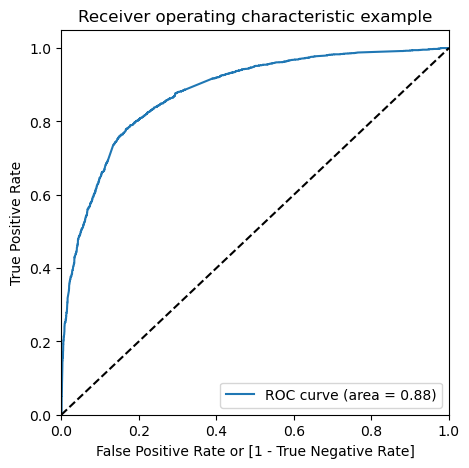

In [114]:
#Draw ROC curve for Train Set
draw_roc(y_train_pred_final["Converted"], y_train_pred_final["Converted_Prob"])

NOTE: 

Area under ROC curve is 0.88 out of 1, indicating a good predictive model.

#### Find Optimal Cut-off Point/ Probability
It is the probability where we get "balanced sensitivity and specificity".

In [115]:
#Create columns with different probability cut-offs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final['Converted_Prob'].map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Prospect ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.474082,1871,0,1,1,1,1,1,0,0,0,0,0
1,0,0.073252,6795,0,1,0,0,0,0,0,0,0,0,0
2,0,0.249087,3516,0,1,1,1,0,0,0,0,0,0,0
3,0,0.768973,8105,1,1,1,1,1,1,1,1,1,0,0
4,0,0.212973,3934,0,1,1,1,0,0,0,0,0,0,0


In [116]:
#Compute accuracy sensitivity and specificity for various probability cut-offs
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

#TP = confusion[1,1] # true positive 
#TN = confusion[0,0] # true negatives
#FP = confusion[0,1] # false positives
#FN = confusion[1,0] # false negatives
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final["Converted"], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.381262  1.000000  0.000000
0.1   0.1  0.595702  0.973642  0.362819
0.2   0.2  0.721243  0.920114  0.598701
0.3   0.3  0.791280  0.832928  0.765617
0.4   0.4  0.813698  0.763585  0.844578
0.5   0.5  0.805195  0.656934  0.896552
0.6   0.6  0.792981  0.585969  0.920540
0.7   0.7  0.779066  0.507705  0.946277
0.8   0.8  0.754020  0.405515  0.968766
0.9   0.9  0.707792  0.247364  0.991504


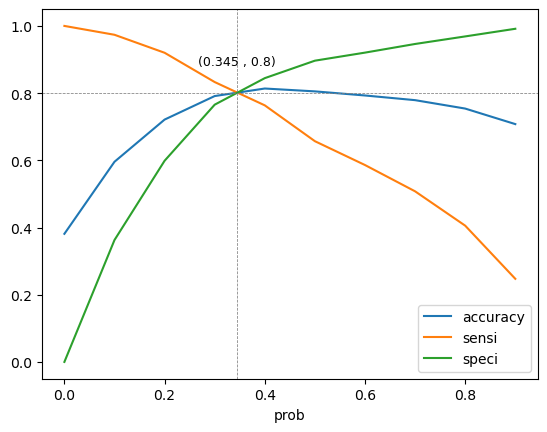

In [117]:
#Graph accuracy, sensitivity, and specificity for various probabilities
from scipy.interpolate import interp1d
from scipy.optimize import fsolve

#Find the intersection points of the sensitivity and accuracy curves
sensi_interp = interp1d(cutoff_df['prob'], cutoff_df['sensi'], kind='linear')
acc_interp = interp1d(cutoff_df['prob'], cutoff_df['accuracy'], kind='linear')
intersection_1 = np.round(float(fsolve(lambda x : sensi_interp(x) - acc_interp(x), 0.5)), 3)

#Find the intersection points of the specificity and accuracy curves
speci_interp = interp1d(cutoff_df['prob'], cutoff_df['speci'], kind='linear')
intersection_2 = np.round(float(fsolve(lambda x : speci_interp(x) - acc_interp(x), 0.5)), 3)

#Calculate the average of the two intersection points
intersection_x = (intersection_1 + intersection_2) / 2

#Interpolate the accuracy, sensitivity, and specificity at the intersection point
accuracy_at_intersection = np.round(float(acc_interp(intersection_x)), 2)
sensitivity_at_intersection = np.round(float(sensi_interp(intersection_x)), 2)
specificity_at_intersection = np.round(float(speci_interp(intersection_x)), 2)

#Plot the three curves and add vertical and horizontal lines at the intersection point
cutoff_df.plot.line(x='prob', y=['accuracy', 'sensi', 'speci'])
plt.axvline(x=intersection_x, color='grey',linewidth=0.55, linestyle='--')
plt.axhline(y=accuracy_at_intersection, color='grey',linewidth=0.55, linestyle='--')

#Add annotation to display the (x,y) intersection point coordinates 
plt.annotate(f'({intersection_x} , {accuracy_at_intersection})',
             xy=(intersection_x, accuracy_at_intersection),
             xytext=(0,20),
             textcoords='offset points',
             ha='center',
             fontsize=9)

#Display the graph
plt.show()

NOTE: 

0.345 is the approximate point where all the curves meet, so 0.345 seems to be the 'optimal cut-off point' for probability threshold.
Mapping is conducted again using optimal cut-off point. 

In [118]:
y_train_pred_final['final_predicted'] = y_train_pred_final['Converted_Prob'].map( lambda x: 1 if x > 0.345 else 0)

#Delete the unwanted columns from dataframe
y_train_pred_final.drop([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,"Predicted"],axis = 1, inplace = True) 
y_train_pred_final.head()

,Converted,Converted_Prob,Prospect ID,final_predicted
0,0,0.474082,1871,1
1,0,0.073252,6795,0
2,0,0.249087,3516,0
3,0,0.768973,8105,1
4,0,0.212973,3934,0


### 9.5. Calculate all Metrics using Confusion Matrix for Train

In [119]:
#Check the overall accuracy
print(metrics.accuracy_score(y_train_pred_final["Converted"], y_train_pred_final["final_predicted"]))

#or can be found using Confusion Matrix with formula, then find all matrix in one go ahead using UDF

0.8045763760049475


In [120]:
#UDF for all Logistic Regression Metrics
def logreg_all_metrics(confusion_matrix):
    TN =confusion_matrix[0,0]
    TP =confusion_matrix[1,1]
    FP =confusion_matrix[0,1]
    FN =confusion_matrix[1,0]
    
    accuracy = (TN+TP)/(TN+TP+FN+FP)
    sensi = TP/(TP+FN)
    speci = TN/(TN+FP)
    precision = TP/(TP+FP)
    recall = TP/(TP+FN)
    TPR = TP/(TP + FN)
    TNR = TN/(TN + FP)
    
    #Calculate false postive rate - predicting conversion when customer does not have converted
    FPR = FP/(FP + TN)     
    FNR = FN/(FN +TP)
    
    print ("True Negative                    : ", TN)
    print ("True Positive                    : ", TP)
    print ("False Negative                   : ", FN)
    print ("False Positve                    : ", FP) 
    
    print ("Model Accuracy                   : ", round(accuracy,4))
    print ("Model Sensitivity                : ", round(sensi,4))
    print ("Model Specificity                : ", round(speci,4))
    print ("Model Precision                  : ", round(precision,4))
    print ("Model Recall                     : ", round(recall,4))
    print ("Model True Positive Rate (TPR)   : ", round(TPR,4))
    print ("Model False Positive Rate (FPR)  : ", round(FPR,4))

In [121]:
#Find Confusion metrics for 'y_train_pred_final' df
confusion_matrix = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['final_predicted'])
print("_"*30,"\n")
print("Confusion Matrix")
print(confusion_matrix,"\n")
print("_"*30,"\n")

#Use UDF to compute all metrices of logistic regression
logreg_all_metrics(confusion_matrix)
print("\n")
print("_"*30,"\n")

______________________________ 

Confusion Matrix
[[3230  772]
 [ 492 1974]] 

______________________________ 

True Negative                    :  3230
True Positive                    :  1974
False Negative                   :  492
False Positve                    :  772
Model Accuracy                   :  0.8046
Model Sensitivity                :  0.8005
Model Specificity                :  0.8071
Model Precision                  :  0.7189
Model Recall                     :  0.8005
Model True Positive Rate (TPR)   :  0.8005
Model False Positive Rate (FPR)  :  0.1929


______________________________ 



### 9.6. Precision and Recall Tradeoff
- Compare all metrics of Precision-Recall view with Specificity-Sensivity view.
- Achieve better probability threshold for boosting conversion rate to 80% as asked by CEO.

In [122]:
#Create Precision-Recall Tradeoff curve
y_train_pred_final['Converted'], y_train_pred_final['final_predicted']
p, r, thresholds = precision_recall_curve(y_train_pred_final['Converted'], y_train_pred_final['Converted_Prob'])

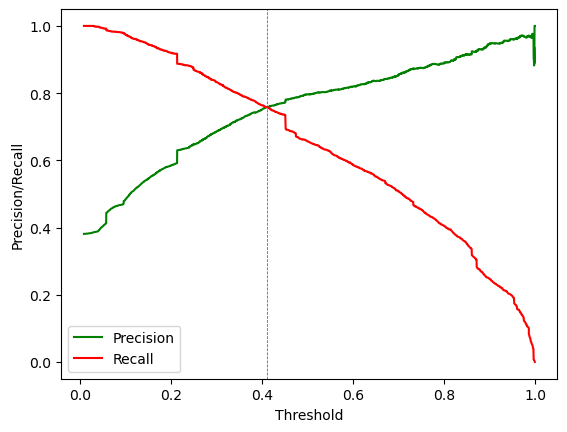

In [123]:
#Graph Precision-Recall Tradeoff curve
plt.plot(thresholds, p[:-1], "g-", label="Precision")
plt.plot(thresholds, r[:-1], "r-", label="Recall")

#Add legend and axis labels
plt.axvline(x=0.41, color='teal',linewidth = 0.55, linestyle='--')
plt.legend(loc='lower left')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')

plt.show()

NOTE: 

The intersection point of the curve is the threshold value where the model achieves a balance between precision and recall. It can be used to optimise the performance of the model based on business requirement. The probability threshold is approximately 0.41 from the above curve.

In [124]:
#Copy df to test model evaluation with precision recall threshold of 0.41
y_train_precision_recall = y_train_pred_final.copy()

In [125]:
#Assign a feature for 0.41 cut-off from precision recall curve to see which one is the best view 
#(sensitivity-specificity or precision-recall)
y_train_precision_recall['precision_recall_prediction'] = y_train_precision_recall['Converted_Prob'].map( lambda x: 1 if x > 0.41 else 0)
y_train_precision_recall.head()

,Converted,Converted_Prob,Prospect ID,final_predicted,precision_recall_prediction
0,0,0.474082,1871,1,1
1,0,0.073252,6795,0,0
2,0,0.249087,3516,0,0
3,0,0.768973,8105,1,1
4,0,0.212973,3934,0,0


In [126]:
#Observe all metrics at 0.41 cut-off in precision-recall view and 
#compare with 0.345 cut-off from sensitivity-specificity view

#Find Confusion metrics for 'y_train_precision_recall' df
confusion_matrix = metrics.confusion_matrix(y_train_precision_recall['Converted'], y_train_precision_recall['precision_recall_prediction'])
print("_"*30,"\n")

print("Confusion Matrix")
print(confusion_matrix,"\n")

print("_"*30,"\n")

#Use UDF to compute all metrices of logistic regression
logreg_all_metrics(confusion_matrix)
print("\n")
print("_"*30,"\n")

______________________________ 

Confusion Matrix
[[3406  596]
 [ 596 1870]] 

______________________________ 

True Negative                    :  3406
True Positive                    :  1870
False Negative                   :  596
False Positve                    :  596
Model Accuracy                   :  0.8157
Model Sensitivity                :  0.7583
Model Specificity                :  0.8511
Model Precision                  :  0.7583
Model Recall                     :  0.7583
Model True Positive Rate (TPR)   :  0.7583
Model False Positive Rate (FPR)  :  0.1489


______________________________ 



NOTE:
- The above metrics indicated that, when the precision-recall threshold cut-off of 0.41 was used, the values in True Positive Rate, Sensitivity, Recall dropped to roughly 75.8%, but the Business Objective required it to be close to 80%.
- When the sensitivity-specificity cut-off threshold of 0.345 was used, the metric was 80%.
- Hence, it is recommended to go with sensitivity-specificity view for the optimal cut-off for final predictions.

### Add 'Lead Score' Feature to Training dataframe 
A higher score indicates that the lead is hot, i.e. is the most likely to be converted, whereas a lower score indicates that the lead is cold, i.e. is the least to be converted.

In [127]:
#Add Lead Score
y_train_pred_final['Lead_Score'] = y_train_pred_final['Converted_Prob'].map( lambda x: round(x*100))
y_train_pred_final.head()

,Converted,Converted_Prob,Prospect ID,final_predicted,Lead_Score
0,0,0.474082,1871,1,47
1,0,0.073252,6795,0,7
2,0,0.249087,3516,0,25
3,0,0.768973,8105,1,77
4,0,0.212973,3934,0,21


## <strong><span style="color:brown">Step 10: Making Predictions on Test Set </span></strong> 

### 10.1. Scale Test dataset

In [128]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2772 entries, 4269 to 2960
Data columns (total 46 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Do Not Email                              2772 non-null   int64  
 1   TotalVisits                               2772 non-null   float64
 2   Total Time Spent on Website               2772 non-null   int64  
 3   Page Views Per Visit                      2772 non-null   float64
 4   Free_copy                                 2772 non-null   int64  
 5   Lead Origin_Landing Page Submission       2772 non-null   uint8  
 6   Lead Origin_Quick Add Form                2772 non-null   uint8  
 7   Lead Source_Facebook                      2772 non-null   uint8  
 8   Lead Source_Google                        2772 non-null   uint8  
 9   Lead Source_Olark Chat                    2772 non-null   uint8  
 10  Lead Source_Organic Search       

In [129]:
#Fetch 'int64' and 'float64' dtype columns from dataframe for scaling
num_cols=X_test.select_dtypes(include=['int64','float64']).columns

#Scale columns
X_test[num_cols] = scaler.transform(X_test[num_cols])

X_test = X_test[rfe_col]
X_test[rfe_col] = X_test[rfe_col].astype(float)
X_test.head()

,Total Time Spent on Website,Lead Origin_Landing Page Submission,Lead Source_Olark Chat,Lead Source_Reference,Lead Source_Welingak Website,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_SMS Sent,Specialization_Hospitality Management,Specialization_Others,Current_occupation_Working Professional
4269,0.964504,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2376,-0.885371,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
7766,-0.777416,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
9199,-0.885371,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4359,-0.885371,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### 10.2. Conduct Prediction on Test Dataset using final model 

In [130]:
#Add a constant value
X_test_sm = sm.add_constant(X_test)
X_test_sm.shape

(2772, 13)

In [131]:
#Make prediction using Model 4 (final model)
y_test_pred = logm4.predict(X_test_sm)

In [132]:
#Top 10 columns
y_test_pred[:10]

4269    0.697934
2376    0.860665
7766    0.889241
9199    0.057065
4359    0.871510
9186    0.503859
1631    0.419681
8963    0.154531
8007    0.072344
5324    0.298849
dtype: float64

In [133]:
#Change to dataframe of the predicted probability
y_test_pred = pd.DataFrame(y_test_pred)
y_test_pred.head()

,0
4269,0.697934
2376,0.860665
7766,0.889241
9199,0.057065
4359,0.871510


In [134]:
#Convert y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,Converted
4269,1
2376,1
7766,1
9199,0
4359,1


In [135]:
#Putt Prospect ID to index
y_test_df['Prospect ID'] = y_test_df.index

#Remove index for both dataframe to append them side by side 
y_test_pred.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

#Append y_test_df and y_test_pred
y_pred_final = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_final.head()

,Converted,Prospect ID,0
0,1,4269,0.697934
1,1,2376,0.860665
2,1,7766,0.889241
3,0,9199,0.057065
4,1,4359,0.871510


In [136]:
#Rename the columns
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

#Rearrange the columns
y_pred_final = y_pred_final.reindex(['Prospect ID','Converted','Converted_Prob'], axis=1)

y_pred_final.head()

,Prospect ID,Converted,Converted_Prob
0,4269,1,0.697934
1,2376,1,0.860665
2,7766,1,0.889241
3,9199,0,0.057065
4,4359,1,0.871510


In [137]:
#Take sensitivity-specificity method at 0.345 probability cut-off during training
y_pred_final['final_predicted'] = y_pred_final['Converted_Prob'].map(lambda x: 1 if x > 0.345 else 0)
y_pred_final.head()

,Prospect ID,Converted,Converted_Prob,final_predicted
0,4269,1,0.697934,1
1,2376,1,0.860665,1
2,7766,1,0.889241,1
3,9199,0,0.057065,0
4,4359,1,0.871510,1


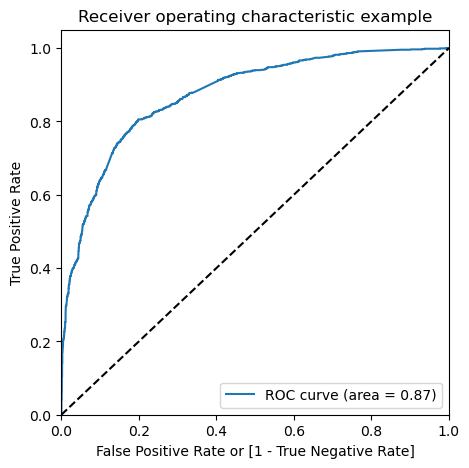

In [138]:
#Draw ROC curve for Test Set
fpr, tpr, thresholds = metrics.roc_curve(y_pred_final["Converted"], y_pred_final["Converted_Prob"], drop_intermediate = False )

draw_roc(y_pred_final["Converted"], y_pred_final["Converted_Prob"])

NOTE: 

Area under ROC curve is 0.87 out of 1, indicating a good predictive model.

NOTE:

The final predictions have been made. The next step would be to evaluate the performance of the predictive model on a Test set by comparing the predicted labels (final_predicted) to the actual labels (Converted) to compute various performance metrics, such as accuracy, precision, recall, etc.

### 10.3. Test Set Model Evaluation
All metrics are calculated using Confusion Matrix for Test set.

In [139]:
#Find Confusion metrics for 'y_train_pred_final' df
confusion_matrix = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final['final_predicted'])
print("_"*30,"\n")

print("Confusion Matrix")
print(confusion_matrix,"\n")

print("_"*30,"\n")

#Use UDF to compute all metrices of logistic regression
logreg_all_metrics(confusion_matrix)
print("\n")
print("_"*30,"\n")

______________________________ 

Confusion Matrix
[[1353  324]
 [ 221  874]] 

______________________________ 

True Negative                    :  1353
True Positive                    :  874
False Negative                   :  221
False Positve                    :  324
Model Accuracy                   :  0.8034
Model Sensitivity                :  0.7982
Model Specificity                :  0.8068
Model Precision                  :  0.7295
Model Recall                     :  0.7982
Model True Positive Rate (TPR)   :  0.7982
Model False Positive Rate (FPR)  :  0.1932


______________________________ 



NOTE: 

The evaluation metrics are pretty close to one another, indicating that the model is performing consistently across different evaluation metrics in both Test and Train dataset.

For Test set
   - Accuracy : 80.34%
   - Sensitivity : 79.82%
   - Specificity : 80.68%
    
These metrics are very close to Train set, so the final model logm4 is performing with consistency on both Train and Test set.

In [140]:
#Display features and their coefficicent from the final model
parameters=logm4.params.sort_values(ascending=False)
parameters

Lead Source_Welingak Website               5.388662
Lead Source_Reference                      2.925326
Current_occupation_Working Professional    2.669665
Last Activity_SMS Sent                     2.051879
Last Activity_Others                       1.253061
Total Time Spent on Website                1.049789
Last Activity_Email Opened                 0.942099
Lead Source_Olark Chat                     0.907184
Last Activity_Olark Chat Conversation     -0.555605
const                                     -1.023594
Specialization_Hospitality Management     -1.094445
Specialization_Others                     -1.203333
Lead Origin_Landing Page Submission       -1.258954
dtype: float64

NOTE: 

A high positive coefficient indicates that, a variable has a stronger influence on predicting the probability of leads converting to take up X-Education's course.

## Add 'Lead Score' Feature to Test dataframe 
A higher score indicates that the lead is hot, i.e. is the most likely to be converted, whereas a lower score indicates that the lead is cold, i.e. is the least to be converted.

In [141]:
#Add Lead Score 

y_pred_final['Lead_Score'] = y_pred_final['Converted_Prob'].map( lambda x: round(x*100))
y_pred_final.head()

,Prospect ID,Converted,Converted_Prob,final_predicted,Lead_Score
0,4269,1,0.697934,1,70
1,2376,1,0.860665,1,86
2,7766,1,0.889241,1,89
3,9199,0,0.057065,0,6
4,4359,1,0.871510,1,87


Lead Score: Lead Score is assigned to the customers
- The customers with a higher lead score have a higher conversion chance.
- The customers with a lower lead score have a lower conversion chance.

# Conclusion

## Train - Test
### Train Data Set:        

- Accuracy: 80.46%

- Sensitivity: 80.05%

- Specificity: 80.71%

### Test Data Set:

- Accuracy: 80.34%

- Sensitivity: 79.82%

- Specificity:80.68%
 

NOTE: The evaluation metrics are pretty close to one another, indicating that the model is performing consistently across different evaluation metrics in both Test and Train dataset.

- The model achieved a sensitivity of 80.05% in the Train set and 79.82% in the Test set, using a cut-off value of 0.345.
- In this case, sensitivity indicates how many leads the model identified correctly out of all potential leads that are converting. 
- The CEO of X Education had set a target sensitivity of around 80%. 
- The model also reached an accuracy of 80.46%, which is in line with the study`s objectives.

## Model Parameters
- The final Logistic Regression Model has 12 features.

### Top 3 features that contribute 'positively' to predicting hot leads in the model are:
- Lead Source_Welingak Website

- Lead Source_Reference

- Current_occupation_Working Professional

NOTE: 

The optimal cut-off probability point is 0.345. Converted probability of greater than 0.345 will be predicted as Converted lead (Hot lead), and probability of less than 0.345 will be predicted as not Converted lead (Cold lead).

# Recommendations

### For boosting our Lead Conversion Rates: 

- Concentrate on features with positive coefficients for targeted marketing strategies.
- Formulate plans to attract high-quality leads from top-performing lead sources.
- Connect with working professionals with tailored messaging.
- Fine-tune communication channels based on lead engagement impact.
- Increase financial allocation on Welingak Website in terms of advertising, etc.
- Provide promotional offers for providing reference that converts to lead, encourage providing more references.
- Employ individuals to be aggressively targeted as they have high conversion rate and will have better financial situation to pay higher fees too. 


### For pinpointing areas of improvement:

- Examine negative coefficients in specialization offerings.
- Assess landing page submission process for areas of improvement.